In [19]:
import numpy as np
from numpy import pi
import matplotlib.pyplot as plt
import os
import zernike
import hamaker
# import parallelize
import time
# from everybeam import load_telescope, LOFAR, Options, thetaphi2cart

# Single frequency

### Generation of beam

#### Comparing two beam from same MS file to see if they are the same at different time

In [21]:
f = 130

ms_path = f'/home/sleepypanda/Desktop/CASSA IUB Chronos/Codes/Everybeam/synthms_hba_dec52.9_t201411041558_SBH51.MS'

npix = 2049
time1 = 4.92183348e09
time2 = time1 + 3600*24
station = 0

a = hamaker.allsky_beam(ms_path, time1, f*1e6, station_id=station, npix=npix)
b = hamaker.allsky_beam(ms_path, time2, f*1e6, station_id=station, npix=npix)

In [22]:
a = np.nan_to_num(a,0)
b = np.nan_to_num(b,0)

# Check shape first
print("Shapes equal:", a.shape == b.shape)

# Check exact equality
print("Arrays equal:", np.array_equal(abs(a[:,:,0,1]), abs(b[:,:,0,1])))

#print("Arrays close:", np.allclose(abs(a[:,:,0,0]), abs(b[:,:,0,0]), rtol=10^2, atol=10))

diff = a[:,:,0,0] - b[:,:,0,0]
dim = diff.shape[0]
total = dim**2
print("Number of total elements:", total)
print("Number of different elements:", np.count_nonzero(diff))
print("Max difference:", np.max(np.abs(diff)))

Shapes equal: True
Arrays equal: True
Number of total elements: 4198401
Number of different elements: 0
Max difference: 0.0


#### Comparing two beam from different ms files to see if they are the same at different time

In [25]:
f = 130

ms_path1 = f'/home/sleepypanda/Desktop/CASSA IUB Chronos/Codes/Everybeam/synthms_hba_dec52.9_t201411041558_SBH51.MS'
ms_path2 = f'/home/sleepypanda/Desktop/CASSA IUB Chronos/Codes/Everybeam/synthms_hba_dec52.9_t201411041658_SBH51.MS'
npix = 2049
time1 = 4.92183348e09
time2 = time1 + 3600
station = 0

a = hamaker.allsky_beam(ms_path1, time1, f*1e6, station_id=station, npix=npix)
b = hamaker.allsky_beam(ms_path2, time2, f*1e6, station_id=station, npix=npix)

In [26]:
a = np.nan_to_num(a,0)
b = np.nan_to_num(b,0)

# Check shape first
print("Shapes equal:", a.shape == b.shape)

# Check exact equality
print("Arrays equal:", np.array_equal(abs(a[:,:,0,1]), abs(b[:,:,0,1])))

#print("Arrays close:", np.allclose(abs(a[:,:,0,0]), abs(b[:,:,0,0]), rtol=10^2, atol=10))

diff = a[:,:,0,0] - b[:,:,0,0]
dim = diff.shape[0]
total = dim**2
print("Number of total elements:", total)
print("Number of different elements:", np.count_nonzero(diff))
print("Max difference:", np.max(np.abs(diff)))

Shapes equal: True
Arrays equal: True
Number of total elements: 4198401
Number of different elements: 0
Max difference: 0.0


#### Comparing two MS files to see if they provide same J values for a specific frequency

In [6]:
f = 130

ms_path = f'/home/sleepypanda/Desktop/CASSA IUB Chronos/Codes/Everybeam/synthms_hba_dec52.9_t201411041558_SBH51.MS'
dout = "/home/sleepypanda/Desktop/CASSA IUB Chronos/Codes/Everybeam/output/"

npix = 2049
time = 4.92183348e09
station = 0

J = hamaker.allsky_beam(ms_path, time, f*1e6, station_id=station, npix=npix)

np.save(dout + 'beam_HBA_%i.npy'%(f), J)

In [7]:
f = 130

ms_path = f'/home/sleepypanda/Desktop/CASSA IUB Chronos/Codes/Everybeam/synthms_hba_dec52.9_t201411041558_SBH358.MS'
dout = "/home/sleepypanda/Desktop/CASSA IUB Chronos/Codes/Everybeam/output/"

npix = 2049
time = 4.92183348e09
station = 0

J = hamaker.allsky_beam(ms_path, time, f*1e6, station_id=station, npix=npix)

np.save(dout + 'diff_beam_HBA_%i.npy'%(f), J)

In [16]:
a = np.load(dout + 'beam_HBA_%i.npy'%f)
b = np.load(dout + 'diff_beam_HBA_%i.npy'%f)

a = np.nan_to_num(a,0)
b = np.nan_to_num(b,0)

# Check shape first
print("Shapes equal:", a.shape == b.shape)

# Check exact equality
print("Arrays equal:", np.array_equal(abs(a[:,:,0,1]), abs(b[:,:,0,1])))

#print("Arrays close:", np.allclose(abs(a[:,:,0,0]), abs(b[:,:,0,0]), rtol=10^2, atol=10))

diff = a[:,:,0,0] - b[:,:,0,0]
dim = diff.shape[0]
total = dim**2
print("Number of total elements:", total)
print("Number of different elements:", np.count_nonzero(diff))
print("Max difference:", np.max(np.abs(diff)))

Shapes equal: True
Arrays equal: True
Number of total elements: 4198401
Number of different elements: 0
Max difference: 0.0


/tmp/ipykernel_4027/2215540755.py:1: RuntimeWarning: invalid value encountered in divide
  plt.imshow(20*np.log10(np.abs(a[:,:,0,0])/np.abs(b[:,:,0,0])), extent=(-90,90,-90,90), vmin=-100, vmax=0)


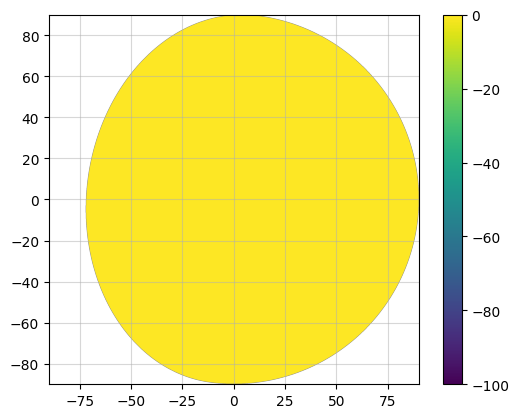

In [17]:
plt.imshow(20*np.log10(np.abs(a[:,:,0,0])/np.abs(b[:,:,0,0])), extent=(-90,90,-90,90), vmin=-100, vmax=0)
plt.colorbar()
plt.grid(alpha=0.5)

### Plot output beam file

/tmp/ipykernel_3380/1217351417.py:7: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(20*np.log10(np.abs(J[:,:,0,0])), extent=(-90,90,-90,90), vmin=-100, vmax=0)


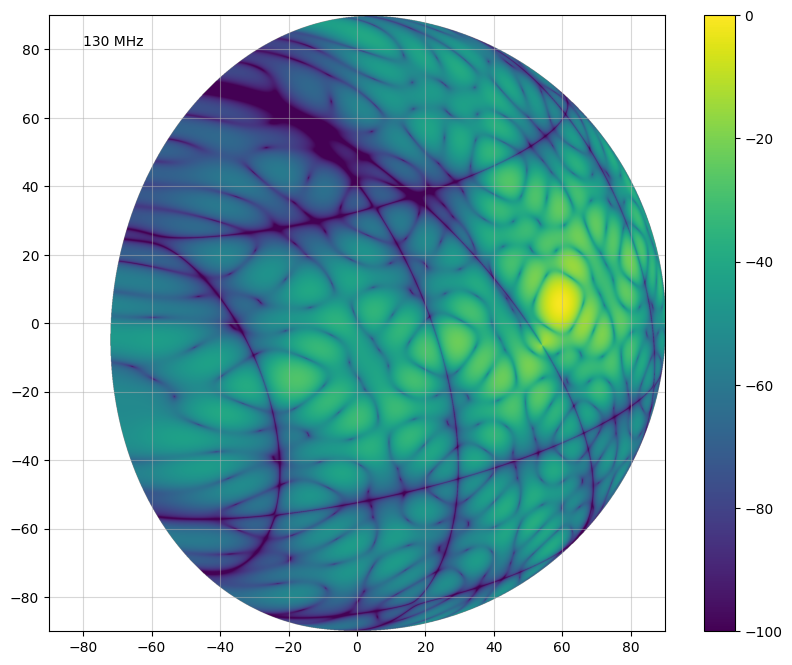

In [122]:
plt.figure(figsize=(10,8))

f = 130
dout = "/home/sleepypanda/Desktop/CASSA IUB Chronos/Codes/Everybeam/output/"
J = np.load(dout + 'beam_HBA_%i.npy'%f)

plt.imshow(20*np.log10(np.abs(J[:,:,0,0])), extent=(-90,90,-90,90), vmin=-100, vmax=0)
plt.colorbar()
plt.grid(alpha=0.5)
plt.text(-80, 81, "%i MHz"%f);

In [115]:
print(J.dtype)
print(J.shape)
print(*J.shape)

complex128
(2049, 2049, 2, 2)
2049 2049 2 2


### Measuring the center of the beam

In [123]:
J[np.isnan(J)] = 0
cent = np.where(np.abs(J[:,:,0,0,])==np.abs(J[:,:,0,0,]).max())
cx, cy = cent[1][0], cent[0][0]
print(cx, cy)

px = 180. / J.shape[0]
r = int(15. / px)

Jz = J[cy-r:cy+r, cx-r:cx+r, :, :]

Jza_db = 20*np.log10(np.abs(Jz))

1700 959


### Plot of Jones matrix components

In [78]:
import os

possible_paths = [
    "/usr/bin/synthms",
    "/usr/local/bin/synthms",
    os.path.expanduser("~/losito/bin/synthms"),
]

synthms_path = next((p for p in possible_paths if os.path.exists(p)), None)
if synthms_path is None:
    raise FileNotFoundError("Could not find synthms in known locations.")

print(synthms_path)

/home/sleepypanda/losito/bin/synthms


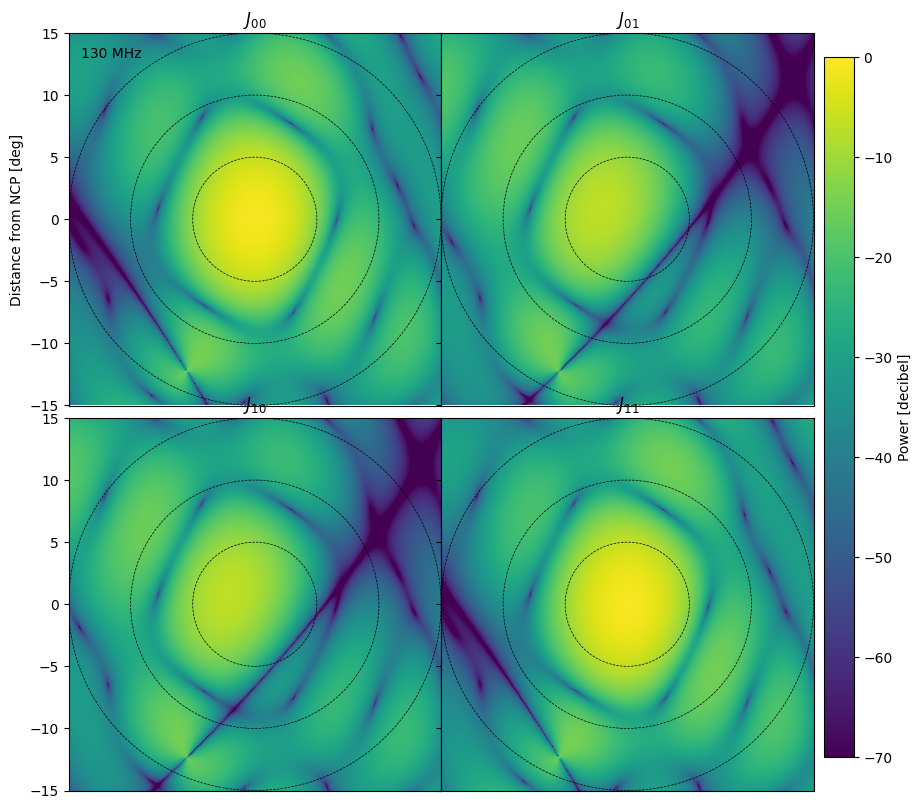

In [4]:
fig = plt.figure(figsize=(10,10), constrained_layout=False)
gs = fig.add_gridspec(2, 2, wspace=0.0, hspace=0.0)
ax = gs.subplots(sharex=True, sharey=True)

radii = [5, 10, 15]

for i in range(2):
    for j in range(2):
        im = ax[i,j].imshow(Jza_db[:,:,j,i], extent=(-15,15,-15,15), vmin=-70, vmax=0)
        ax[i,j].set_xticks([])
        ax[i,j].set_title("$J_{%i%i}$"%(i,j))
        for rad in radii: ax[i,j].add_patch(plt.Circle((0, 0), rad, fill=None, color='k', linestyle='--', linewidth=0.5))

fig.subplots_adjust(right=0.87)
cax = fig.add_axes([0.88, 0.15, 0.03, 0.7])
cb = fig.colorbar(im, cax=cax)
cb.ax.set_ylabel('Power [decibel]')
ax[0,0].set_ylabel('Distance from NCP [deg]')
ax[0,0].text(-14, 13, "%i MHz"%f);


### dB plots of jones components

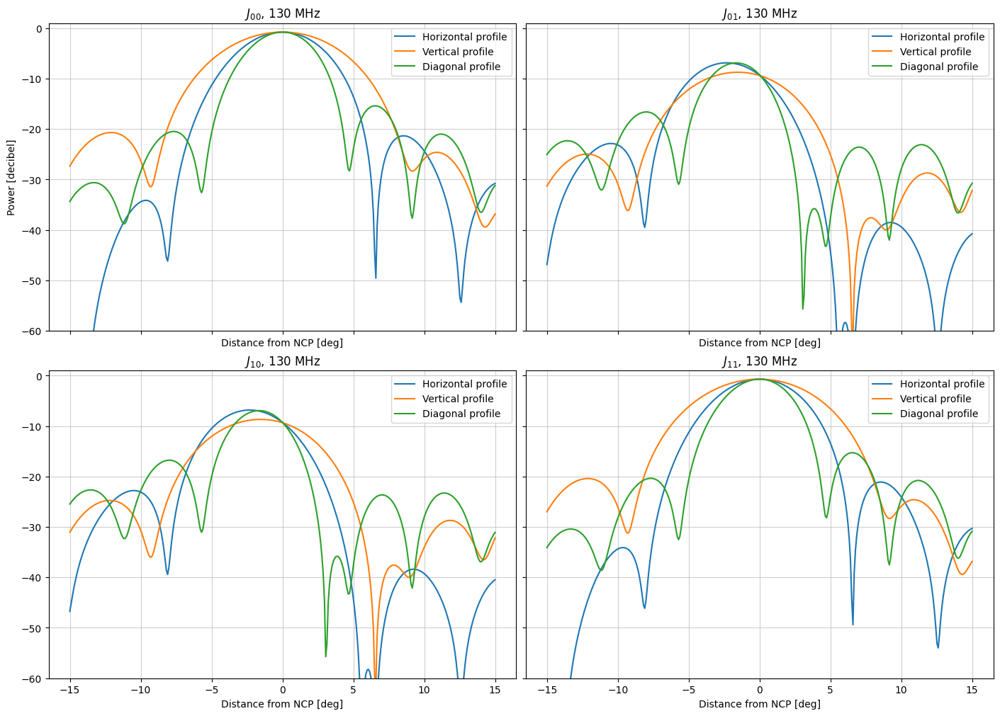

In [5]:
fig = plt.figure(figsize=(14,10), constrained_layout=True)
gs = fig.add_gridspec(2, 2, wspace=0.0, hspace=0.0)
ax = gs.subplots(sharex=True, sharey=True)

x = np.linspace(-15,15,r*2)

for i in range(2):
    for j in range(2):
        ax[i,j].plot(x, Jza_db[r,:,j,i], label='Horizontal profile')
        ax[i,j].plot(x, Jza_db[:,r,j,i], label='Vertical profile')
        ax[i,j].plot(x, np.diagonal(Jza_db[:,:,i,j]), label='Diagonal profile')
        ax[i,j].set_title("$J_{%i%i}$, %i MHz"%(i,j,f))
        ax[i,j].set_xlabel('Distance from NCP [deg]')
        ax[i,j].set_ylim([-60,1])
        # ax[i].set_xlim([-15,15])
        ax[i,j].grid(alpha=.6)
        ax[i,j].legend();

ax[0,0].set_ylabel('Power [decibel]');


### Zernike modelling

In [117]:
import zernike

def zernike_decom(J, modes = 200, energy_trunc_ratio = 0.5):
    
    if len(J.shape) == 2:
        Cr = zernike.decompose(J.real, modes)
        Ci = zernike.decompose(J.imag, modes)

        C = np.abs(Cr + 1j*Ci)**2
        sorted_ind = np.argsort(C)[::-1]
    
        energy_ratio = C/sum(C)
        sorted_energy = energy_ratio[sorted_ind]
    
        thresh = np.argmax(sorted_energy < energy_trunc_ratio/100.0) + 1

        return np.array([Cr, Ci]), thresh
    
    thresh_list = []
    coef = np.empty((2,2,2,modes))
    
    for i in range(2):
        for j in range(2):
            data = J[:,:,j,i]
            
            Cr = zernike.decompose(data.real, modes)
            Ci = zernike.decompose(data.imag, modes) 
            coef[i][j] = [Cr, Ci]
            
            C = np.abs(Cr + 1j*Ci)**2
            sorted_ind = np.argsort(C)[::-1]
    
            energy_ratio = C/sum(C)
            sorted_energy = energy_ratio[sorted_ind]
    
            thresh = np.argmax(sorted_energy < energy_trunc_ratio/100.0) + 1
            thresh_list.append(thresh)

    thresh = np.max(thresh_list)
            
    return coef, thresh

In [118]:
def zernike_coefs(coef, thresh):
    
    if len(coef.shape) == 2:
        recon_Cr, ind_Cr = zernike.truncate(coef[0], thresh)
        recon_Ci, ind_Ci = zernike.truncate(coef[1], thresh)

        sort_ind = [ind_Cr, ind_Ci]
        recon_coef = [recon_Cr, recon_Ci]

        return np.array([sort_ind, recon_coef])

    # recon_coef = np.empty((2,2,2,thresh))
    # sortedind = np.empty((2,2,2,thresh))
    coef_compiled = np.empty((2,2,2,2,thresh))
    
    for i in range(2):
        for j in range(2):
            
            recon_Cr, ind_Cr = zernike.truncate(coef[i][j][0], thresh)
            recon_Ci, ind_Ci = zernike.truncate(coef[i][j][1], thresh)

            recon_coef = [recon_Cr, recon_Ci]
            sort_ind = [ind_Cr, ind_Ci]

            coef_compiled[i][j] = [sort_ind, recon_coef]

    return coef_compiled

In [119]:
def zernike_recon(data, coef, sortind=None):

    thresh = coef.shape[-1]

    if len(coef.shape) == 3:
        Mr = zernike.reconstruct(coef[1][0], coef[0][0], data)
        Mi = zernike.reconstruct(coef[1][1], coef[0][1], data)
        
    else:
        if sortind is None:
            sortedindex_r = range(thresh)
            sortedindex_i = range(thresh)
        else:
            sortedindex_r = sortind[0]
            sortedindex_i = sortind[1]
            
        Mr = zernike.reconstruct(coef[0], sortedindex_r, data)
        Mi = zernike.reconstruct(coef[1], sortedindex_i, data)


    mod = np.abs(Mr+1j*Mi)
    
    rho, phi, mask = zernike.unit_disk(mod.shape[0])
    dat = np.abs(data)*mask
    # res = np.abs(dat-mod)*mask

    Jz = [dat, mod]

    return Jz

In [120]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def zernike_plot(Jz, r, c):

    res = np.abs(Jz[0]-Jz[1])

    imgs = 20*np.log10(np.array([Jz[0], Jz[1], res]))
    
    labels = ['Hamaker', 'Zernike', 'Residual']

    fig, ax = plt.subplots(2, 3, figsize=(12, 8), constrained_layout=True)

    px = 180. / 2049
    R = int(15. / px)

    for i in range(3):
        ax[0,i].axis('off')
        im = ax[0,i].imshow(imgs[i,...], vmin=-70, vmax=0)
        div = make_axes_locatable(ax[0,i])
        cax = div.append_axes("top", size="5%", pad=0.1)  # Changed this line
        cb = fig.colorbar(im, cax=cax, orientation="horizontal")
        cb.ax.set_xlabel("%s $J_{%i%i}$"%(labels[i],r,c))
        cb.ax.xaxis.set_label_position('top') 

    x = np.linspace(-15,15,R*2)
    
    for i in range(3):
        ax[1,i].plot(x, imgs[i][R,:], label='Horizontal profile')
        ax[1,i].plot(x, imgs[i][:,R], label='Vertical profile')
        ax[1,i].plot(x, np.diagonal(imgs[i][:,:]), label='Diagonal profile')
        # cax = div.new_vertical(size='5%', pad=0.3)
        # fig.add_axes(cax)
        ax[1,i].set_title("$J_{%i%i}$, %s"%(r,c,labels[i]))
        ax[1,i].set_xlabel('Distance from NCP [deg]')
        ax[1,i].set_ylim([-60,1])
        ax[1,i].set_xlim([-15,15])
        ax[1,i].grid(alpha=.6)
        ax[1,i].legend()     

    plt.show()

/tmp/ipykernel_3380/758330571.py:7: RuntimeWarning: divide by zero encountered in log10
  imgs = 20*np.log10(np.array([Jz[0], Jz[1], res]))


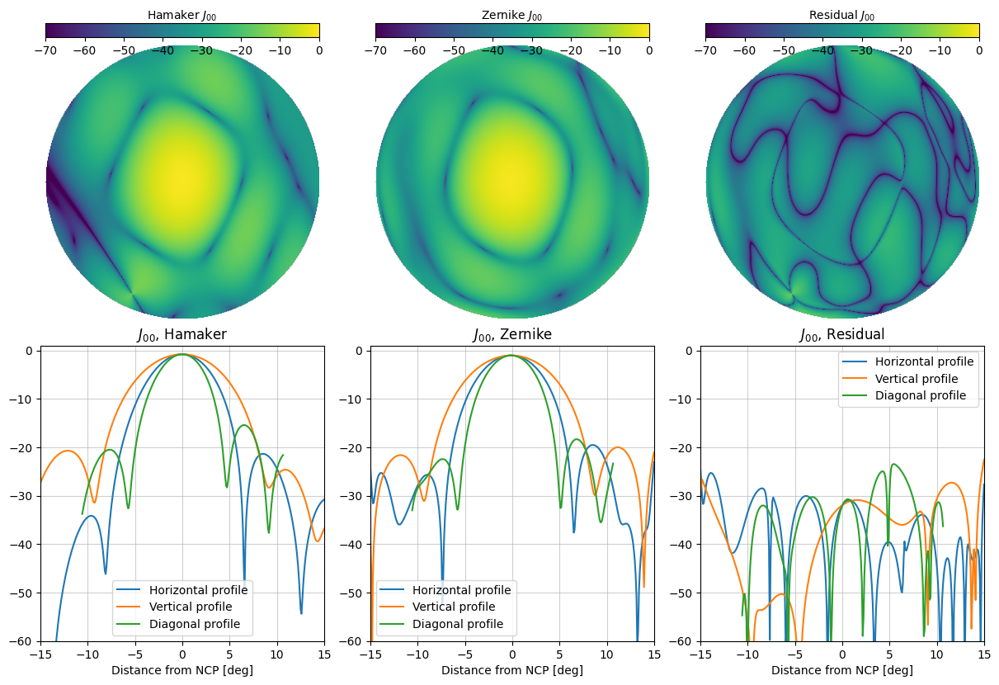

In [124]:
i=0
coef, thresh = zernike_decom(Jz[:,:,i,i], modes=200)
reduced_coef = zernike_coefs(coef, thresh)
Jzr = zernike_recon(Jz[:,:,i,i], reduced_coef)
zernike_plot(Jzr, i,i)

In [126]:
print(np.array(Jzr).dtype)

float64


In [10]:
for i in range(2):
    for j in range(2):
        coef, thresh = zernike_decom(Jz[:,:,j,i], modes=200)
        reduced_coef = zernike_coefs(coef, thresh)
        Jzr = zernike_recon(Jz[:,:,j,i], reduced_coef)
        zernike_plot(Jzr, i,j)

NameError: name 'Jz' is not defined

### Picking up the threshold for optimum reconstruction

In [14]:
i = 0
data = Jz[:,:,i,i]
modes = 200

Cr = zernike.decompose(data.real, modes)
Ci = zernike.decompose(data.imag, modes)
C = np.abs(Cr + 1j*Ci)**2
sorted_ind = np.argsort(C)[::-1]

In [15]:
energy_ratio = C/sum(C)
sorted_energy = energy_ratio[sorted_ind]

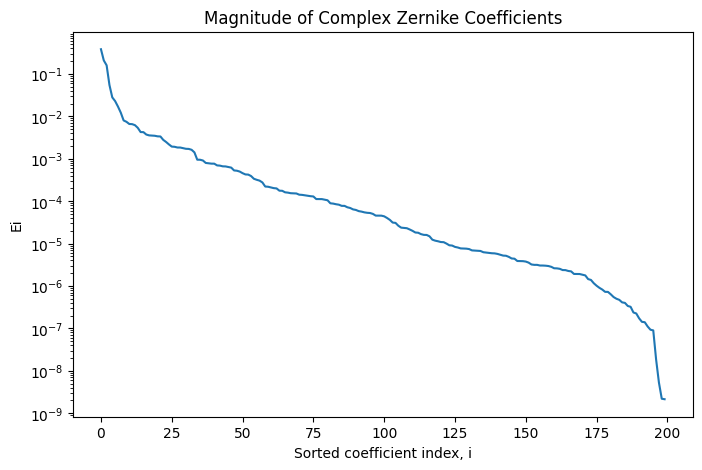

In [16]:
plt.figure(figsize=(8,5))
plt.plot(sorted_energy)
plt.xlabel("Sorted coefficient index, i")
plt.ylabel("Ei")
plt.yscale("log")
plt.title("Magnitude of Complex Zernike Coefficients")
plt.show()

In [17]:
energy_trunc_ratio = 0.5   #in percentage
thres = np.argmax(sorted_energy < energy_trunc_ratio/100.0) + 1

print("Threshold =", thres)

Threshold = 15


In [27]:
modes = 200
energy_trunc_ratio = 0.5   #in percentage

for i in range(2):
    for j in range(2):
        data = Jz[:,:,j,i]
        
        Cr = zernike.decompose(data.real, modes)
        Ci = zernike.decompose(data.imag, modes)
        C = np.abs(Cr + 1j*Ci)**2
        sorted_ind = np.argsort(C)[::-1]

        energy_ratio = C/sum(C)
        sorted_energy = energy_ratio[sorted_ind]

        thresh = np.argmax(sorted_energy < energy_trunc_ratio/100.0) + 1
        print(f"Threshold for J_{i}{j} = {thresh}")

Threshold for J_00 = 15
Threshold for J_01 = 24
Threshold for J_10 = 24
Threshold for J_11 = 15


# All frequencies

### Beam data of multiple frequencies combined

In [18]:
start_freq = 120
end_freq = 180

npix = 2049
time = 4.92183348e09
station = 0

dout = "/home/sleepypanda/Desktop/CASSA IUB Chronos/Codes/Everybeam/output/"
interval = 2
freqs = np.arange(start_freq, end_freq + 1, interval)

In [106]:
J_comp = []
ms_path = f'/home/sleepypanda/Desktop/CASSA IUB Chronos/Codes/Everybeam/synthms_hba_dec52.9_t201411041558_SBH51.MS'

for f in freqs:
    J = hamaker.allsky_beam(ms_path, time, f*1e6, station_id=station, npix=npix)

    J[np.isnan(J)] = 0
    cent = np.where(np.abs(J[:,:,0,0,])==np.abs(J[:,:,0,0,]).max())
    cx, cy = cent[1][0], cent[0][0]
        
    px = 180. / J.shape[0]
    r = int(15. / px)
    
    Jz = J[cy-r:cy+r, cx-r:cx+r, :, :]
    
    #Jz = np.stack(Jz, axis=0)
    J_comp.append(Jz)
    print(f'%i_done'%(f))

J_comp = np.array(J_comp)
J_comp.shape

120_done
122_done
124_done
126_done
128_done
130_done
132_done
134_done
136_done
138_done
140_done
142_done
144_done
146_done
148_done
150_done
152_done
154_done
156_done
158_done
160_done
162_done
164_done
166_done
168_done
170_done
172_done
174_done
176_done
178_done
180_done


(31, 340, 340, 2, 2)

In [107]:
np.save(dout + 'beam_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval), J_comp)

### zernike.decom+recon on all freqs

In [85]:
J_comp = np.load(dout + 'beam_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))
print(J_comp.shape)

num_freq = J_comp.shape[0]
modes = 200
energy_trunc_ratio = 0.5

(31, 340, 340, 2, 2)


In [131]:
coef_comp = []
thresh_list = []

for f in range(num_freq):
    J = J_comp[f]
    
    # J[np.isnan(J)] = 0
    # cent = np.where(np.abs(J[:,:,0,0,])==np.abs(J[:,:,0,0,]).max())
    # cx, cy = cent[1][0], cent[0][0]
        
    # px = 180. / J.shape[0]
    # r = int(15. / px)
    
    # Jz = J[cy-r:cy+r, cx-r:cx+r, :, :]
    
    # J_db = 20*np.log10(np.abs(Jz))
    
    coef, thresh = zernike_decom(J, modes, energy_trunc_ratio)
    coef_comp.append(coef)
    thresh_list.append(thresh)
    print(f'Freq_%i_done'%(start_freq + interval*f))

thresh = np.max(thresh_list)
coef_comp = np.array(coef_comp)

Freq_120_done
Freq_122_done
Freq_124_done
Freq_126_done
Freq_128_done
Freq_130_done
Freq_132_done
Freq_134_done
Freq_136_done
Freq_138_done
Freq_140_done
Freq_142_done
Freq_144_done
Freq_146_done
Freq_148_done
Freq_150_done
Freq_152_done
Freq_154_done
Freq_156_done
Freq_158_done
Freq_160_done
Freq_162_done
Freq_164_done
Freq_166_done
Freq_168_done
Freq_170_done
Freq_172_done
Freq_174_done
Freq_176_done
Freq_178_done
Freq_180_done


In [132]:
np.save(dout + 'coef_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval), coef_comp)

In [20]:
coef_comp = np.load(dout + 'coef_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))
#thresh = 27
print(coef_comp.shape)
#print(thresh)

(31, 2, 2, 2, 200)


In [133]:
recon_coef_comp = []

for f in range(num_freq):

    coef = coef_comp[f]
    recon_coef = zernike_coefs(coef, thresh)

    recon_coef_comp.append(recon_coef)

recon_coef_comp = np.array(recon_coef_comp)

In [134]:
np.save(dout + 'recon_coef_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval), recon_coef_comp)

In [21]:
recon_coef_comp = np.load(dout + 'recon_coef_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))
print(recon_coef_comp.shape)

(31, 2, 2, 2, 2, 26)


In [135]:
Jz_comp = []

#coef = np.empty((2,2,2,modes))

for f in range(num_freq):
    
    recon_coef = recon_coef_comp[f]
    J = J_comp[f]
    # Jz = J[cy-r:cy+r, cx-r:cx+r, :, :]
    
    Jz_db = np.empty((2,J.shape[0],J.shape[0],2,2))
    
    for i in range(2):
        for j in range(2):
            Jzr = zernike_recon(J[:,:,j,i], recon_coef[i][j]);
            print(f'Jones_%i%i_done'%(i,j))
            #recom_coef[i][j] = recom
            Jz_db[:,:,:,j,i] = Jzr
            
    print(f'Freq_%i_done'%(start_freq + interval*f))
    Jz_comp.append(Jz_db)

Jz_comp = np.array(Jz_comp)

Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_120_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_122_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_124_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_126_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_128_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_130_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_132_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_134_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_136_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_138_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_140_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_142_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_144_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_146_done
Jones_00_done
Jones_

In [136]:
np.save(dout + 'JzdB_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval), Jz_comp)

In [22]:
Jz_comp = np.load(dout + 'JzdB_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))
print(Jz_comp.shape)

(31, 2, 340, 340, 2, 2)


### Checking if the files are working

/tmp/ipykernel_3126/758330571.py:7: RuntimeWarning: divide by zero encountered in log10
  imgs = 20*np.log10(np.array([Jz[0], Jz[1], res]))


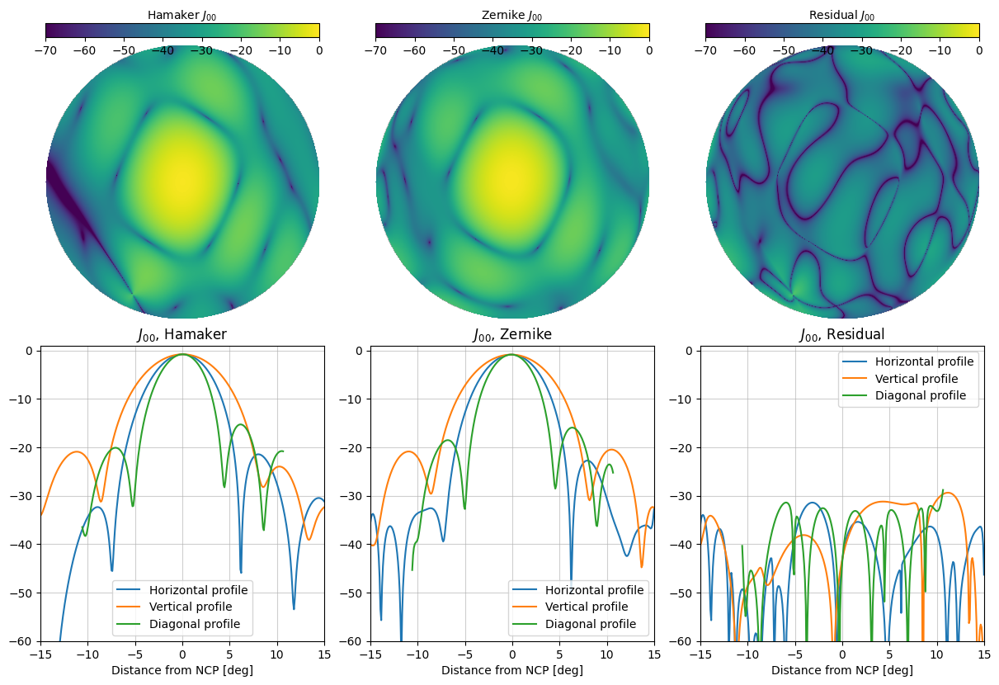

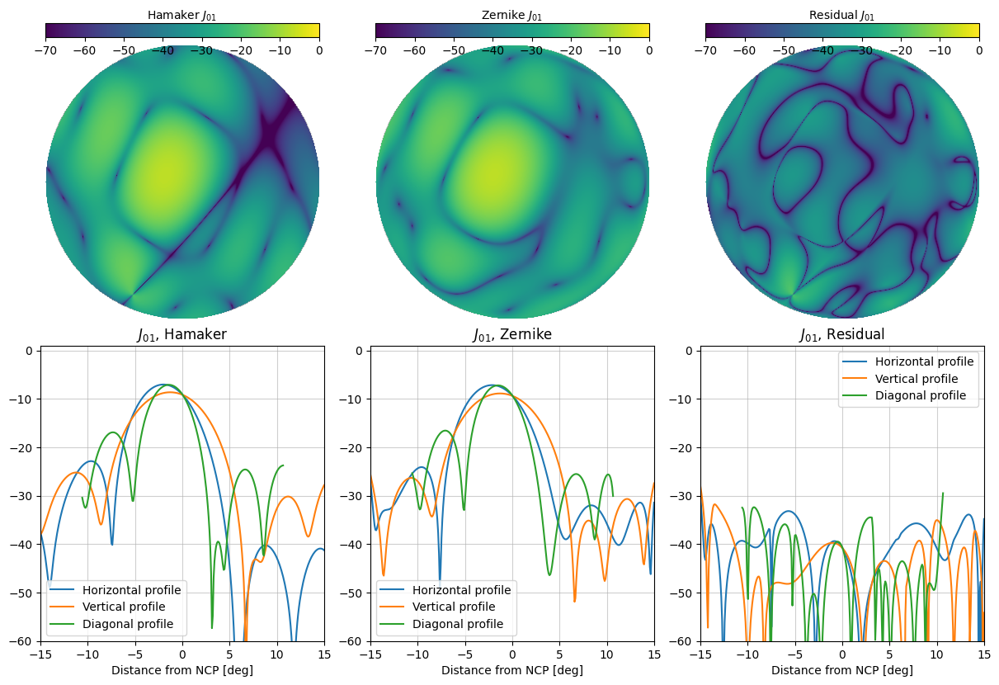

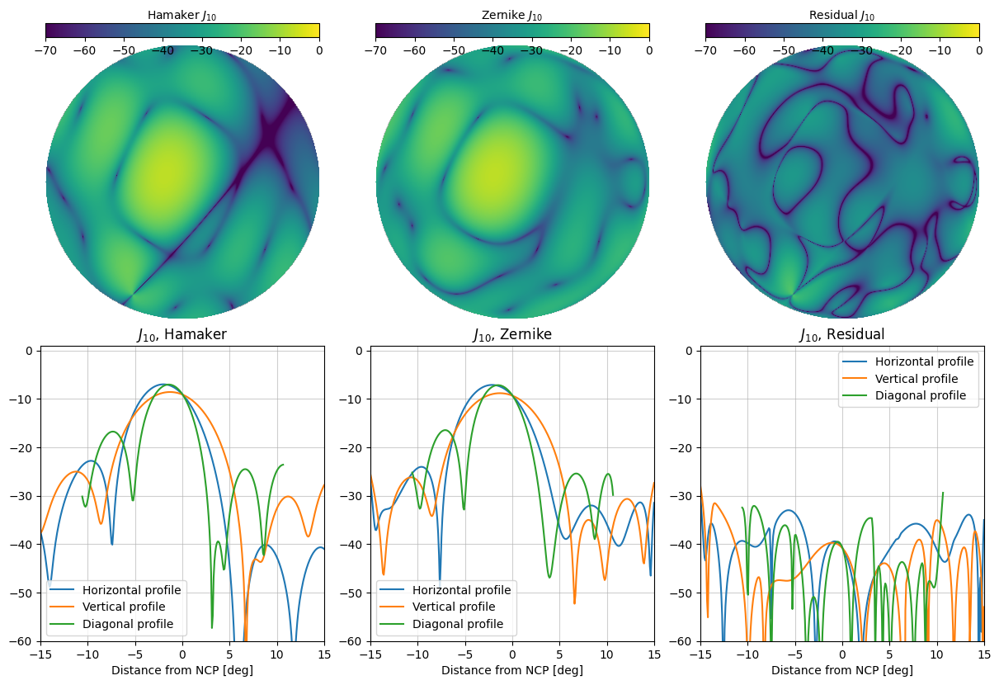

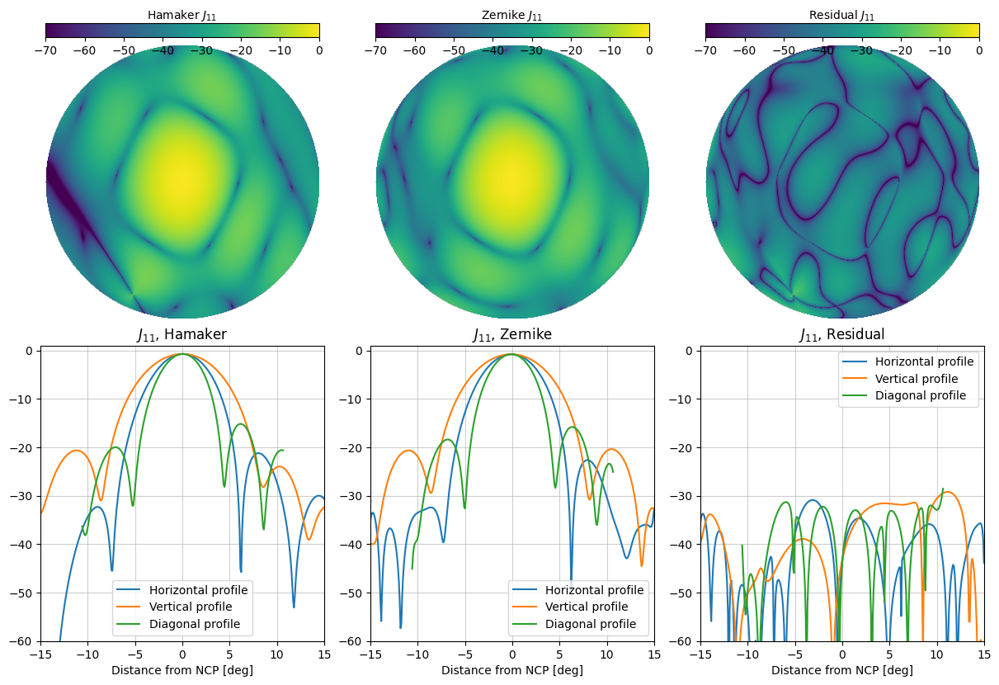

In [11]:
Jzr = Jz_comp[10]
for i in range(2):
    for j in range(2):
        zernike_plot(Jzr[:,:,:,j,i],i,j)

/tmp/ipykernel_3126/758330571.py:7: RuntimeWarning: divide by zero encountered in log10
  imgs = 20*np.log10(np.array([Jz[0], Jz[1], res]))


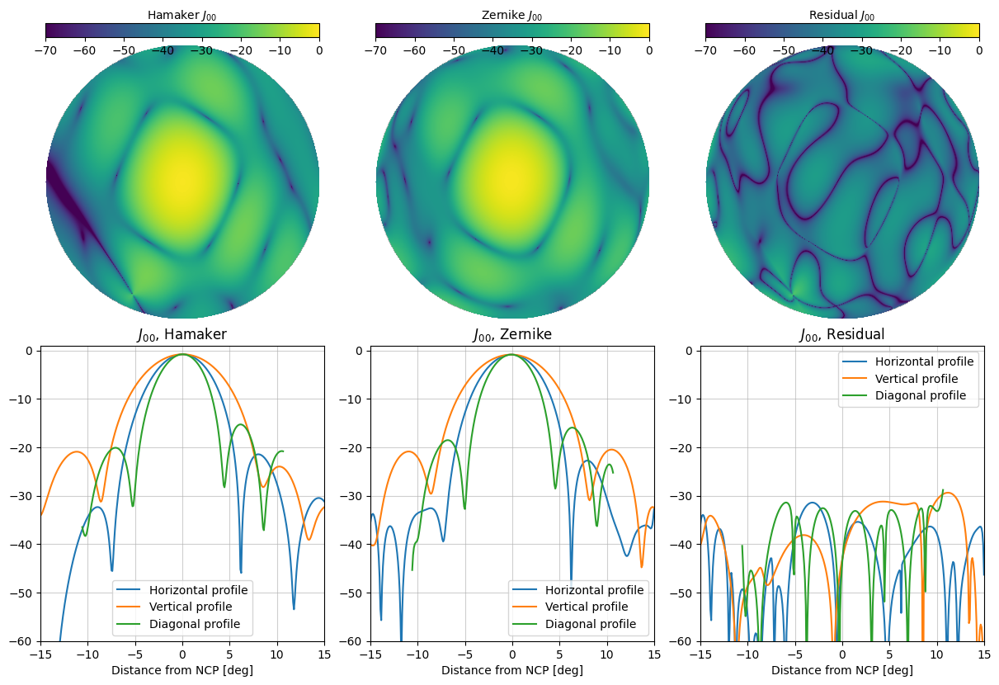

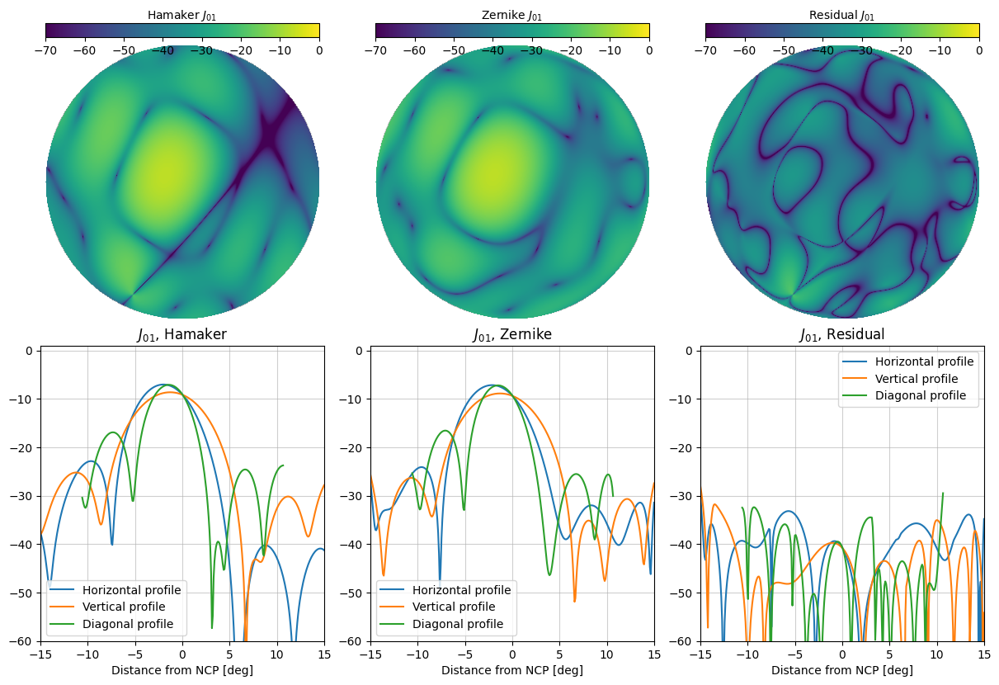

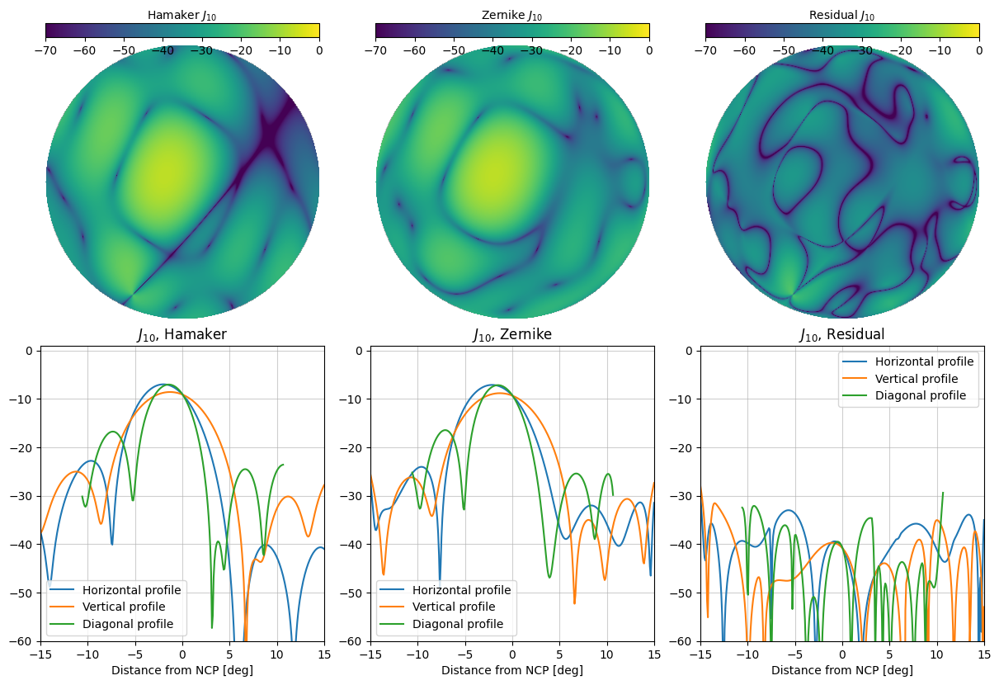

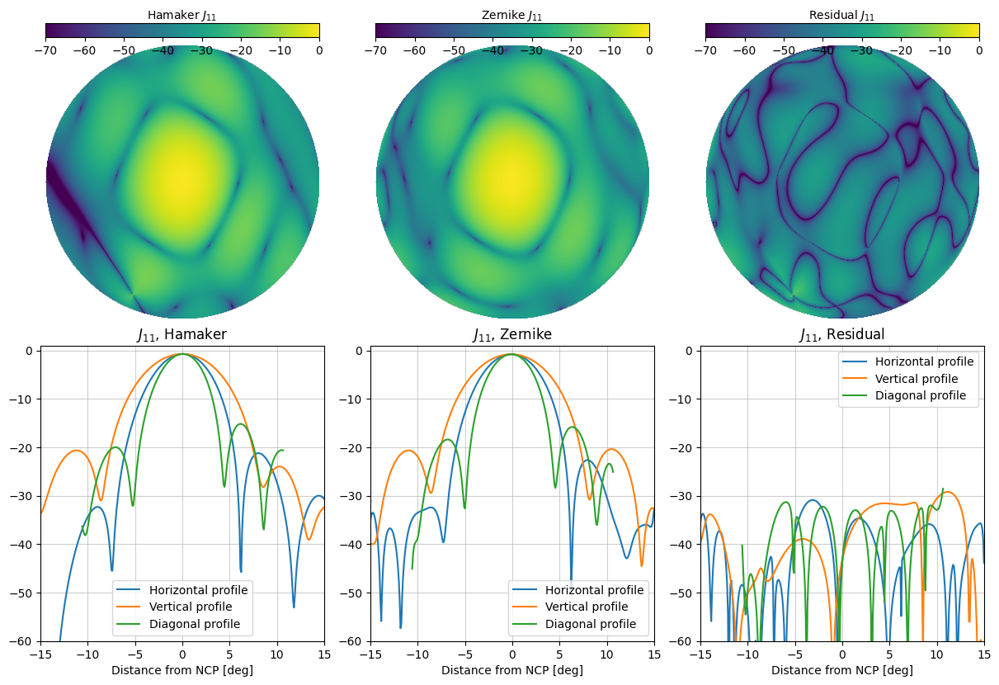

In [12]:
recon_coef = recon_coef_comp[10]
J = Jz_comp[10]
# Jz = J[cy-r:cy+r, cx-r:cx+r, :, :]

for i in range(2):
    for j in range(2):
        Jzr = zernike_recon(J[0,:,:,j,i], recon_coef[i][j])
        zernike_plot(Jzr,i,j)

### Normalized MRSE on all freqs

In [13]:
Jz_comp = np.load(dout + 'JzdB_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))

num_freq = Jz_comp.shape[0]

mrse_comp = []

for f in range(num_freq):
    mrse_polar = np.empty((2,2))
    Jz = Jz_comp[f]
    data = Jz[0]
    mod = Jz[1]
    
    for i in range(2):
        for j in range(2):
            
            res = np.abs(data[:,:,j,i] - mod[:,:,j,i])
            mrse = np.sqrt(np.mean(res**2))/np.mean(data[:,:,j,i])
            mrse_polar[i][j] = mrse

    mrse_comp.append(mrse_polar)

mrse_comp = np.array(mrse_comp)

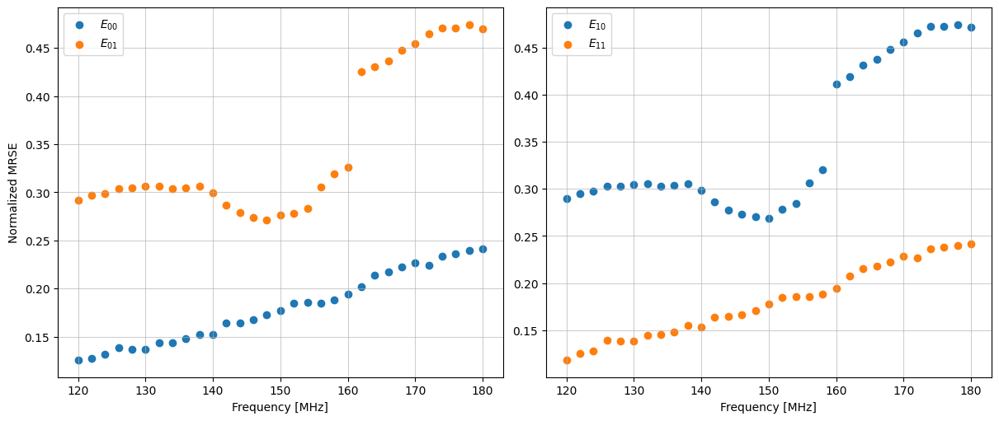

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

#interval = 5
freq = np.arange(start_freq,end_freq+1,interval)

for i in range(2):
    for j in range(2):
        ax[i].scatter(freq, mrse_comp[:,i,j], label="$E_{%i%i}$"%(i,j))

    ax[i].set_xlabel('Frequency [MHz]')
    # ax[i].set_ylim([0,0.5])
    # ax[i].set_xlim([20,80])
    ax[i].grid(alpha=.6)
    ax[i].legend()    

ax[0].set_ylabel('Normalized MRSE')
plt.show()

### Modelling the spectral behaviour of Zernike coeffs

#### Choosing which modelling function to use

In [57]:
from scipy.optimize import curve_fit
from scipy.fftpack import dct, idct
from scipy.interpolate import CubicSpline
import sklearn
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# -------------------------
# Candidate model functions
# -------------------------
def poly_design_matrix(freqs, deg):
    """Returns Vandermonde-like matrix for [1, f, f^2, ... f^deg]"""
    F = np.vstack([freqs**d for d in range(deg+1)]).T
    return F

def fit_poly(freqs_train, y_train, deg=3):
    """Fit polynomial model using least squares"""
    F = poly_design_matrix(freqs_train, deg)
    coeffs, *_ = np.linalg.lstsq(F, y_train, rcond=None)
    return coeffs

def predict_poly(coeffs, freqs_test):
    """Predict using polynomial coefficients"""
    F = poly_design_matrix(freqs_test, len(coeffs)-1)
    return F @ coeffs

def fit_poly_plus_inv(freqs_train, y_train, deg=2):
    """Model: A0 + A1/f + A2*f + A3*f^2 + ..."""
    # Add small epsilon to avoid division by zero issues
    inv = 1.0 / (freqs_train + 1e-12)
    F_poly = poly_design_matrix(freqs_train, deg)
    F = np.column_stack([inv, F_poly])
    coeffs, *_ = np.linalg.lstsq(F, y_train, rcond=None)
    return coeffs

def predict_poly_plus_inv(coeffs, freqs_test, deg=2):
    """Predict using polynomial + 1/f model"""
    inv = 1.0 / (freqs_test + 1e-12)
    F_poly = poly_design_matrix(freqs_test, deg)
    F = np.column_stack([inv, F_poly])
    return F @ coeffs

def poly_plus_sin_model(freqs, *params):
    """Physical model: A0 + A1/f + A2*f + A3*f^2 + A_sin*sin(2πf/f0 + φ)"""
    A0, Ainv, A1, A2, A_sin, f0, phi = params
    return A0 + Ainv / (freqs + 1e-12) + A1*freqs + A2*freqs**2 + A_sin * np.sin(2*np.pi*freqs / f0 + phi)

def fit_poly_plus_sin(freqs_train, y_train, deg=2):
    """Fit polynomial + sinusoidal model using nonlinear optimization"""
    # Better initial guesses
    A0_guess = np.mean(y_train)
    Ainv_guess = 0.0
    A1_guess = (y_train[-1] - y_train[0]) / (freqs_train[-1] - freqs_train[0])  # slope
    A2_guess = 0.0
    A_sin_guess = 0.5 * np.std(y_train)  # based on variability
    f0_guess = 2 * (freqs_train[-1] - freqs_train[0])  # period guess
    phi_guess = 0.0
    
    p0 = [A0_guess, Ainv_guess, A1_guess, A2_guess, A_sin_guess, f0_guess, phi_guess]

    # More reasonable bounds
    f_range = freqs_train[-1] - freqs_train[0]
    lower = [-np.inf, -np.inf, -np.inf, -np.inf, -10*np.std(y_train), f_range/10, -2*np.pi]
    upper = [ np.inf,  np.inf,  np.inf,  np.inf,  10*np.std(y_train), f_range*10, 2*np.pi]

    try:
        popt, _ = curve_fit(poly_plus_sin_model, freqs_train, y_train, 
                           p0=p0, bounds=(lower, upper), maxfev=10000)
        return popt
    except Exception as e:
        print(f"Warning: poly+sin fit failed: {e}")
        return None

def predict_poly_plus_sin(popt, freqs_test):
    """Predict using polynomial + sinusoidal model"""
    if popt is None:
        return np.full_like(freqs_test, np.nan)
    return poly_plus_sin_model(freqs_test, *popt)

def fit_dct_trunc(y_full, Nd):
    """Fit DCT model with truncation to Nd components"""
    # Compute DCT of full series
    c = dct(y_full, type=2, norm='ortho')
    # Keep only first Nd coefficients
    c_trunc = np.zeros_like(c)
    c_trunc[:min(Nd, len(c))] = c[:min(Nd, len(c))]
    return c_trunc

def predict_from_dct(c_trunc):
    """Reconstruct signal from truncated DCT coefficients"""
    return idct(c_trunc, type=3, norm='ortho')

def robust_spline_fit(f_train, y_train, f_test, n_knots=None):
    """Robust spline fitting with optional knot compression and error handling"""
    try:
        if len(f_train) < 4:
            # Not enough points for cubic spline, use linear interpolation
            return np.interp(f_test, f_train, y_train)
        
        if n_knots is None or n_knots >= len(f_train):
            # Use all points as knots (standard cubic spline)
            cs = CubicSpline(f_train, y_train, bc_type='natural')
            return cs(f_test)
        else:
            # Use reduced number of knots for compression
            from scipy.interpolate import BSpline, splrep, splev
            
            # Ensure we have enough knots for cubic spline
            n_knots = max(4, min(n_knots, len(f_train)))
            
            # Create spline with specified number of knots
            # splrep returns (knots, coefficients, degree)
            tck = splrep(f_train, y_train, k=3, s=0, t=None)  # k=3 for cubic
            
            # If we want fewer knots, we need to use a smoothing spline
            if n_knots < len(f_train):
                # Use smoothing parameter to reduce effective knots
                # Higher s = more smoothing = fewer effective knots
                smoothing_factor = len(f_train) / n_knots
                tck = splrep(f_train, y_train, k=3, s=smoothing_factor)
            
            # Evaluate at test points
            return splev(f_test, tck)
            
    except Exception as e:
        print(f"Warning: spline fit failed, using linear interpolation: {e}")
        return np.interp(f_test, f_train, y_train)

# -------------------------
# Cross-validation wrapper
# -------------------------
def compare_models(freqs, zs, verbose=True, Nd=7, poly_deg=5, spline_knots=7):
    """
    Compare different models using Leave-One-Out Cross-Validation
    
    Parameters:
    -----------
    freqs : array_like, shape (M,)
        Frequency values
    zs : array_like, shape (M, Nz)  
        Zernike coefficients, M frequencies × Nz coefficients
    verbose : bool
        Print detailed results
    Nd : int
        Number of DCT components to keep
    poly_deg : int
        Polynomial degree for basic polynomial model
    spline_knots : int or None
        Number of knots for spline compression. If None, uses all data points
        
    Returns:
    --------
    dict : RMSE values for each model and coefficient
    """
    M, Nz = zs.shape
    loo = LeaveOneOut()

    models = ['poly', 'poly+1/f', 'poly+sin', 'dct', 'spline']
    rmses = {m: np.zeros(Nz) for m in models}

    for zind in range(Nz):
        y = zs[:, zind]
        errs = {m: [] for m in models}

        for train_idx, test_idx in loo.split(freqs):
            f_train, f_test = freqs[train_idx], freqs[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]

            # 1. Polynomial model
            try:
                coeffs_poly = fit_poly(f_train, y_train, deg=poly_deg)
                y_pred_poly = predict_poly(coeffs_poly, f_test)
                errs['poly'].append((y_test - y_pred_poly)[0]**2)
            except Exception as e:
                errs['poly'].append(np.inf)

            # 2. Polynomial + 1/f model
            try:
                coeffs_pinv = fit_poly_plus_inv(f_train, y_train, deg=2)
                y_pred_pinv = predict_poly_plus_inv(coeffs_pinv, f_test, deg=2)
                errs['poly+1/f'].append((y_test - y_pred_pinv)[0]**2)
            except Exception as e:
                errs['poly+1/f'].append(np.inf)

            # 3. Polynomial + sin model (nonlinear)
            try:
                popt = fit_poly_plus_sin(f_train, y_train, deg=2)
                y_pred_psin = predict_poly_plus_sin(popt, f_test)
                if np.isnan(y_pred_psin).any():
                    errs['poly+sin'].append(np.inf)
                else:
                    errs['poly+sin'].append((y_test - y_pred_psin)[0]**2)
            except Exception as e:
                errs['poly+sin'].append(np.inf)

            # 4. DCT model - Fixed implementation
            try:
                # Create full signal by interpolating missing test point
                y_interp = y.copy()
                if len(train_idx) > 1:
                    y_interp[test_idx[0]] = np.interp(f_test[0], f_train, y_train)
                else:
                    y_interp[test_idx[0]] = y_train[0]  # fallback
                    
                # Fit DCT on interpolated full signal
                c_trunc = fit_dct_trunc(y_interp, Nd)
                y_pred_dct_full = predict_from_dct(c_trunc)
                errs['dct'].append((y_test - y_pred_dct_full[test_idx[0]])[0]**2)
            except Exception as e:
                errs['dct'].append(np.inf)

            # 5. Cubic spline model (with optional knot compression)
            try:
                y_pred_spline = robust_spline_fit(f_train, y_train, f_test, n_knots=spline_knots)
                if np.isscalar(y_pred_spline):
                    y_pred_spline = np.array([y_pred_spline])
                errs['spline'].append((y_test - y_pred_spline)[0]**2)
            except Exception as e:
                errs['spline'].append(np.inf)

        # Aggregate RMSE for this coefficient (handle inf values)
        for m in models:
            finite_errs = [e for e in errs[m] if np.isfinite(e)]
            if finite_errs:
                rmses[m][zind] = np.sqrt(np.mean(finite_errs))
            else:
                rmses[m][zind] = np.inf

    if verbose:
        print("Model comparison (LOOCV RMSE) per Zernike coefficient:")
        print("Zindex\tpoly\t\tpoly+1/f\tpoly+sin\tdct\t\tspline")
        print("-" * 70)
        for k in range(Nz):
            row = []
            for m in models:
                if np.isfinite(rmses[m][k]):
                    row.append(f"{rmses[m][k]:.4e}")
                else:
                    row.append("FAILED")
            print(f"{k:02d}\t" + "\t".join(row))

        print("\nAverage RMSE across all Zernike coefficients:")
        print("-" * 50)
        for m in models:
            finite_vals = rmses[m][np.isfinite(rmses[m])]
            if len(finite_vals) > 0:
                avg_rmse = np.mean(finite_vals)
                n_success = len(finite_vals)
                print(f"{m:12s}: {avg_rmse:.4e} ({n_success}/{Nz} successful fits)")
            else:
                print(f"{m:12s}: ALL FITS FAILED")

        # Find best model for each coefficient
        print(f"\nBest model per coefficient:")
        print("-" * 30)
        for k in range(Nz):
            best_model = min(models, key=lambda m: rmses[m][k] if np.isfinite(rmses[m][k]) else np.inf)
            best_rmse = rmses[best_model][k]
            if np.isfinite(best_rmse):
                print(f"Z{k:02d}: {best_model:12s} (RMSE: {best_rmse:.4e})")
            else:
                print(f"Z{k:02d}: ALL MODELS FAILED")

        # Print model configuration info
        print(f"\nModel Configuration:")
        print(f"- Polynomial degree: {poly_deg}")
        print(f"- DCT components: {Nd}")
        print(f"- Spline knots: {'All data points' if spline_knots is None else spline_knots}")

    return rmses

# -------------------------
# Additional utility functions
# -------------------------
def plot_model_comparison(freqs, zs, coeff_idx=0, models_to_plot=['poly', 'spline', 'poly+sin'], poly_deg=3, spline_knots=None):
    """
    Plot actual vs predicted values for selected models and coefficient
    """
    y = zs[:, coeff_idx]
    
    # Determine subplot layout based on number of models
    n_models = len(models_to_plot)
    if n_models <= 3:
        fig_size = (15, 5)
        n_rows, n_cols = 1, n_models + 1  # +1 for actual data plot
    else:
        fig_size = (15, 10)
        n_rows, n_cols = 2, 3
    
    plt.figure(figsize=fig_size)
    
    # Plot actual data
    plt.subplot(n_rows, n_cols, 1)
    plt.plot(freqs, y, 'ko-', label='Actual', markersize=4)
    plt.xlabel('Frequency [MHz]')
    plt.ylabel(f'Zernike Coefficient {coeff_idx}')
    plt.title('Actual Data')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    # Plot model fits
    colors = ['r', 'g', 'b', 'm', 'c', 'orange']  # Colors for different models
    
    for i, model in enumerate(models_to_plot):
        plt.subplot(n_rows, n_cols, i+2)
        color = colors[i % len(colors)]
        
        try:
            # Fit full model for visualization
            if model == 'poly':
                coeffs = fit_poly(freqs, y, deg=poly_deg)
                y_pred = predict_poly(coeffs, freqs)
                plt.plot(freqs, y, 'ko-', label='Actual', markersize=4)
                plt.plot(freqs, y_pred, f'{color}--', label=f'Poly deg={poly_deg}', linewidth=2)
                
            elif model == 'poly+1/f':
                coeffs = fit_poly_plus_inv(freqs, y, deg=2)
                y_pred = predict_poly_plus_inv(coeffs, freqs, deg=2)
                plt.plot(freqs, y, 'ko-', label='Actual', markersize=4)
                plt.plot(freqs, y_pred, f'{color}--', label='Poly + 1/f', linewidth=2)
                
            elif model == 'poly+sin':
                popt = fit_poly_plus_sin(freqs, y, deg=2)
                if popt is not None:
                    y_pred = predict_poly_plus_sin(popt, freqs)
                    plt.plot(freqs, y, 'ko-', label='Actual', markersize=4)
                    plt.plot(freqs, y_pred, f'{color}--', label='Poly + Sin', linewidth=2)
                    
                    # Display fitted parameters in title
                    A0, Ainv, A1, A2, A_sin, f0, phi = popt
                    param_str = f'f₀={f0:.1f}, A_sin={A_sin:.3f}'
                    plt.title(f'Model: {model}\n{param_str}', fontsize=10)
                else:
                    plt.plot(freqs, y, 'ko-', label='Actual', markersize=4)
                    plt.text(0.5, 0.5, 'Fit Failed', transform=plt.gca().transAxes, 
                            ha='center', va='center', fontsize=14, color='red')
                    plt.title(f'Model: {model} (FAILED)')
                
            elif model == 'spline':
                # Use robust spline with knot compression if specified
                y_pred = robust_spline_fit(freqs, y, freqs, n_knots=spline_knots)
                plt.plot(freqs, y, 'ko-', label='Actual', markersize=4)
                
                # Create label based on knot configuration
                if spline_knots is None:
                    spline_label = 'Cubic Spline'
                    title_suffix = ''
                else:
                    spline_label = f'Spline (k={spline_knots})'
                    title_suffix = f'\n{spline_knots} knots'
                
                plt.plot(freqs, y_pred, f'{color}--', label=spline_label, linewidth=2)
                plt.title(f'Model: {model}{title_suffix}')
                
            elif model == 'dct':
                # For DCT, use a reasonable number of components
                Nd = min(8, len(y)//2)
                c_trunc = fit_dct_trunc(y, Nd)
                y_pred = predict_from_dct(c_trunc)
                plt.plot(freqs, y, 'ko-', label='Actual', markersize=4)
                plt.plot(freqs, y_pred, f'{color}--', label=f'DCT (Nd={Nd})', linewidth=2)
            
            # Set title if not already set (for models without custom titles)
            if model not in ['poly+sin', 'spline'] or (model == 'poly+sin' and popt is None):
                plt.title(f'Model: {model}')
                
        except Exception as e:
            # Handle fitting errors gracefully
            plt.plot(freqs, y, 'ko-', label='Actual', markersize=4)
            plt.text(0.5, 0.5, f'Error: {str(e)[:30]}...', transform=plt.gca().transAxes, 
                    ha='center', va='center', fontsize=10, color='red')
            plt.title(f'Model: {model} (ERROR)')
        
        plt.xlabel('Frequency [MHz]')
        plt.ylabel(f'Zernike Coefficient {coeff_idx}')
        plt.grid(True, alpha=0.3)
        plt.legend()
    
    plt.tight_layout()
    plt.show()

def get_best_models(rmses):
    """
    Return the best model for each coefficient based on RMSE
    """
    models = list(rmses.keys())
    Nz = len(rmses[models[0]])
    
    best_models = {}
    for k in range(Nz):
        best_model = min(models, key=lambda m: rmses[m][k] if np.isfinite(rmses[m][k]) else np.inf)
        best_rmse = rmses[best_model][k]
        if np.isfinite(best_rmse):
            best_models[k] = (best_model, best_rmse)
        else:
            best_models[k] = (None, np.inf)
    
    return best_models

In [108]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.fftpack import dct, idct
from scipy.interpolate import CubicSpline, interp1d
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import mean_squared_error
import pandas as pd
from collections import defaultdict
import warnings

class ZernikeSpectralAnalyzer:
    """
    Comprehensive spectral analysis for varying Zernike coefficients across frequencies
    """
    
    def __init__(self, freqs, real_noll_indices, imag_noll_indices, 
                 real_coeffs, imag_coeffs):
        """
        Initialize with frequency-varying Zernike data
        
        Parameters:
        -----------
        freqs : array_like
            Frequency values
        real_noll_indices : list of arrays
            Noll indices for real parts at each frequency
        imag_noll_indices : list of arrays  
            Noll indices for imaginary parts at each frequency
        real_coeffs : list of arrays
            Real coefficient values at each frequency
        imag_coeffs : list of arrays
            Imaginary coefficient values at each frequency
        """
        self.freqs = np.array(freqs)
        self.real_noll_indices = real_noll_indices
        self.imag_noll_indices = imag_noll_indices
        self.real_coeffs = real_coeffs
        self.imag_coeffs = imag_coeffs
        
        # Get all unique Noll indices across all frequencies
        self.all_real_nolls = self._get_all_unique_indices(real_noll_indices)
        self.all_imag_nolls = self._get_all_unique_indices(imag_noll_indices)
        
        # Create standardized data matrices
        self.real_matrix, self.real_mask = self._create_data_matrix(
            real_noll_indices, real_coeffs, self.all_real_nolls)
        self.imag_matrix, self.imag_mask = self._create_data_matrix(
            imag_noll_indices, imag_coeffs, self.all_imag_nolls)
    
    def _get_all_unique_indices(self, noll_list):
        """Get all unique Noll indices across frequencies"""
        all_indices = set()
        for indices in noll_list:
            all_indices.update(indices)
        return sorted(list(all_indices))
    
    def _create_data_matrix(self, noll_list, coeff_list, all_nolls):
        """
        Create standardized data matrix with NaN for missing coefficients
        Returns matrix and mask indicating valid data
        """
        n_freq = len(self.freqs)
        n_coeffs = len(all_nolls)
        
        data_matrix = np.full((n_freq, n_coeffs), np.nan)
        mask_matrix = np.zeros((n_freq, n_coeffs), dtype=bool)
        
        for i, (noll_indices, coeffs) in enumerate(zip(noll_list, coeff_list)):
            for j, noll_idx in enumerate(noll_indices):
                if noll_idx in all_nolls:
                    col_idx = all_nolls.index(noll_idx)
                    data_matrix[i, col_idx] = coeffs[j]
                    mask_matrix[i, col_idx] = True
        
        return data_matrix, mask_matrix
    
    def get_coefficient_coverage(self):
        """Analyze how many frequencies each coefficient appears at"""
        coverage_stats = {}
        
        for coeff_type, matrix, mask, noll_list in [
            ('real', self.real_matrix, self.real_mask, self.all_real_nolls),
            ('imag', self.imag_matrix, self.imag_mask, self.all_imag_nolls)
        ]:
            coverage = np.sum(mask, axis=0)  # Count valid entries per coefficient
            coverage_stats[coeff_type] = {
                'noll_indices': noll_list,
                'frequency_count': coverage,
                'coverage_fraction': coverage / len(self.freqs)
            }
        
        return coverage_stats
    
    def filter_coefficients_by_coverage(self, min_coverage_fraction=0.7):
        """
        Filter coefficients that appear in at least min_coverage_fraction of frequencies
        """
        coverage_stats = self.get_coefficient_coverage()
        
        filtered_data = {}
        for coeff_type in ['real', 'imag']:
            stats = coverage_stats[coeff_type]
            valid_mask = stats['coverage_fraction'] >= min_coverage_fraction
            
            filtered_nolls = [noll for i, noll in enumerate(stats['noll_indices']) if valid_mask[i]]
            
            if coeff_type == 'real':
                filtered_matrix = self.real_matrix[:, valid_mask]
                filtered_mask = self.real_mask[:, valid_mask]
            else:
                filtered_matrix = self.imag_matrix[:, valid_mask]
                filtered_mask = self.imag_mask[:, valid_mask]
            
            filtered_data[coeff_type] = {
                'noll_indices': filtered_nolls,
                'matrix': filtered_matrix,
                'mask': filtered_mask
            }
        
        return filtered_data
    
    def interpolate_missing_values(self, method='linear', extrapolate=True):
        """
        Interpolate missing coefficient values across frequencies
        """
        interpolated_data = {}
        
        for coeff_type, matrix, mask in [
            ('real', self.real_matrix, self.real_mask),
            ('imag', self.imag_matrix, self.imag_mask)
        ]:
            interp_matrix = matrix.copy()
            
            for col_idx in range(matrix.shape[1]):
                col_data = matrix[:, col_idx]
                col_mask = mask[:, col_idx]
                
                if np.sum(col_mask) >= 2:  # Need at least 2 points to interpolate
                    valid_freqs = self.freqs[col_mask]
                    valid_values = col_data[col_mask]
                    
                    # Create interpolator
                    if method == 'linear':
                        f_interp = interp1d(valid_freqs, valid_values, 
                                          kind='linear', 
                                          fill_value='extrapolate' if extrapolate else np.nan,
                                          bounds_error=False)
                    elif method == 'cubic' and len(valid_values) >= 4:
                        f_interp = interp1d(valid_freqs, valid_values, 
                                          kind='cubic',
                                          fill_value='extrapolate' if extrapolate else np.nan,
                                          bounds_error=False)
                    else:
                        # Fallback to linear if not enough points for cubic
                        f_interp = interp1d(valid_freqs, valid_values, 
                                          kind='linear',
                                          fill_value='extrapolate' if extrapolate else np.nan,
                                          bounds_error=False)
                    
                    # Interpolate missing values
                    missing_mask = ~col_mask
                    if np.any(missing_mask):
                        interp_matrix[missing_mask, col_idx] = f_interp(self.freqs[missing_mask])
            
            interpolated_data[coeff_type] = interp_matrix
        
        return interpolated_data
    
    def analyze_coefficient_spectral_behavior(self, coeff_type='real', noll_idx=None, 
                                            models=['poly', 'poly+1/f', 'poly+sin', 'spline','dct'], 
                                            use_interpolated=True):
        """
        Analyze spectral behavior of specific coefficients or all coefficients
        """
        if use_interpolated:
            interp_data = self.interpolate_missing_values()
            if coeff_type == 'real':
                data_matrix = interp_data['real']
                noll_list = self.all_real_nolls
            else:
                data_matrix = interp_data['imag']  
                noll_list = self.all_imag_nolls
        else:
            # Use filtered data (coefficients present in most frequencies)
            filtered_data = self.filter_coefficients_by_coverage()
            data_matrix = filtered_data[coeff_type]['matrix']
            noll_list = filtered_data[coeff_type]['noll_indices']
        
        if noll_idx is not None:
            # Analyze specific coefficient
            if noll_idx not in noll_list:
                raise ValueError(f"Noll index {noll_idx} not found in {coeff_type} coefficients")
            
            col_idx = noll_list.index(noll_idx)
            coeff_values = data_matrix[:, col_idx]
            
            # Remove NaN values if any remain
            valid_mask = ~np.isnan(coeff_values)
            if not np.all(valid_mask):
                freqs_clean = self.freqs[valid_mask]
                values_clean = coeff_values[valid_mask]
            else:
                freqs_clean = self.freqs
                values_clean = coeff_values
            
            # Reshape for compatibility with compare_models
            zs_shaped = values_clean.reshape(-1, 1)
            
            # Use the existing compare_models function
            rmses = compare_models(freqs_clean, zs_shaped, verbose=False)
            
            return {
                'noll_index': noll_idx,
                'frequencies': freqs_clean,
                'values': values_clean,
                'model_rmses': rmses,
                'best_model': min(rmses.keys(), key=lambda m: rmses[m][0])
            }
        
        else:
            # Analyze all coefficients
            results = {}
            for i, noll in enumerate(noll_list):
                try:
                    result = self.analyze_coefficient_spectral_behavior(
                        coeff_type, noll, models, use_interpolated)
                    results[noll] = result
                except Exception as e:
                    print(f"Warning: Failed to analyze {coeff_type} Noll {noll}: {e}")
                    continue
            
            return results
    
    def plot_coefficient_evolution(self, coeff_type='real', noll_indices=None, 
                                 max_plots=9, use_interpolated=True):
        """
        Plot how selected coefficients evolve with frequency
        """
        if use_interpolated:
            interp_data = self.interpolate_missing_values()
            if coeff_type == 'real':
                data_matrix = interp_data['real']
                noll_list = self.all_real_nolls
                original_mask = self.real_mask
            else:
                data_matrix = interp_data['imag']
                noll_list = self.all_imag_nolls
                original_mask = self.imag_mask
        else:
            filtered_data = self.filter_coefficients_by_coverage()
            data_matrix = filtered_data[coeff_type]['matrix']
            noll_list = filtered_data[coeff_type]['noll_indices']
            original_mask = filtered_data[coeff_type]['mask']
        
        if noll_indices is None:
            # Select coefficients with best coverage
            coverage_stats = self.get_coefficient_coverage()
            coverage = coverage_stats[coeff_type]['coverage_fraction']
            if coeff_type == 'real':
                valid_indices = np.where([noll in noll_list for noll in self.all_real_nolls])[0]
                sorted_indices = sorted(valid_indices, key=lambda i: coverage[i], reverse=True)
            else:
                valid_indices = np.where([noll in noll_list for noll in self.all_imag_nolls])[0]  
                sorted_indices = sorted(valid_indices, key=lambda i: coverage[i], reverse=True)
            
            # Take top coefficients up to max_plots
            selected_nolls = [self.all_real_nolls[i] if coeff_type == 'real' 
                            else self.all_imag_nolls[i] for i in sorted_indices[:max_plots]]
        else:
            selected_nolls = noll_indices[:max_plots]
        
        n_plots = len(selected_nolls)
        n_cols = min(3, n_plots)
        n_rows = (n_plots + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
        if n_plots == 1:
            axes = [axes]
        elif n_rows == 1:
            axes = axes.flatten()
        else:
            axes = axes.flatten()
        
        for i, noll in enumerate(selected_nolls):
            if i >= len(axes):
                break
                
            ax = axes[i]
            
            if noll in noll_list:
                col_idx = noll_list.index(noll)
                coeff_values = data_matrix[:, col_idx]
                
                # Plot original data points
                if use_interpolated:
                    # Show which points were original vs interpolated
                    if coeff_type == 'real':
                        orig_col_idx = self.all_real_nolls.index(noll)
                        orig_mask = original_mask[:, orig_col_idx]
                    else:
                        orig_col_idx = self.all_imag_nolls.index(noll)
                        orig_mask = original_mask[:, orig_col_idx]
                    
                    # Original points
                    ax.plot(self.freqs[orig_mask], coeff_values[orig_mask], 
                           'ko', markersize=6, label='Original data')
                    # Interpolated points
                    interp_mask = ~orig_mask & ~np.isnan(coeff_values)
                    if np.any(interp_mask):
                        ax.plot(self.freqs[interp_mask], coeff_values[interp_mask], 
                               'ro', markersize=4, alpha=0.7, label='Interpolated')
                    
                    # Connect with line
                    valid_mask = ~np.isnan(coeff_values)
                    ax.plot(self.freqs[valid_mask], coeff_values[valid_mask], 'b-', alpha=0.5)
                else:
                    # Just plot available data
                    valid_mask = ~np.isnan(coeff_values)
                    ax.plot(self.freqs[valid_mask], coeff_values[valid_mask], 'ko-')
                
                ax.set_title(f'{coeff_type.title()} Noll {int(noll)}')
                ax.set_xlabel('Frequency [MHz]')
                ax.set_ylabel('Coefficient Value')
                ax.grid(True, alpha=0.3)
                if use_interpolated:
                    ax.legend()
        
        # Hide unused subplots
        for i in range(n_plots, len(axes)):
            axes[i].set_visible(False)
        
        plt.tight_layout()
        plt.show()
    
    def summary_report(self):
        """Generate comprehensive summary report"""
        coverage_stats = self.get_coefficient_coverage()
        
        print("=== ZERNIKE COEFFICIENT SPECTRAL ANALYSIS SUMMARY ===")
        print(f"Frequency range: {self.freqs[0]:.1f} - {self.freqs[-1]:.1f} MHz")
        print(f"Number of frequencies: {len(self.freqs)}")
        print()
        
        for coeff_type in ['real', 'imag']:
            stats = coverage_stats[coeff_type]
            print(f"{coeff_type.upper()} COEFFICIENTS:")
            print(f"  Total unique Noll indices: {len(stats['noll_indices'])}")
            print(f"  Min coverage: {np.min(stats['frequency_count'])} frequencies ({np.min(stats['coverage_fraction']):.2%})")
            print(f"  Max coverage: {np.max(stats['frequency_count'])} frequencies ({np.max(stats['coverage_fraction']):.2%})")
            print(f"  Mean coverage: {np.mean(stats['frequency_count']):.1f} frequencies ({np.mean(stats['coverage_fraction']):.2%})")
            
            # Show coefficients with full coverage
            full_coverage = np.sum(stats['coverage_fraction'] == 1.0)
            print(f"  Coefficients present at all frequencies: {full_coverage}")
            
            if full_coverage > 0:
                full_coverage_nolls = [noll for i, noll in enumerate(stats['noll_indices']) 
                                     if stats['coverage_fraction'][i] == 1.0]
                print(f"    Noll indices: {full_coverage_nolls}")
            print()

# Example usage and helper functions
def analyze_all_zernike_components(freqs, real_noll_indices, imag_noll_indices, 
                                 real_coeffs, imag_coeffs, 
                                 min_coverage=0.8, plot_examples=True):
    """
    Complete analysis workflow for all Zernike components
    """
    # Initialize analyzer
    analyzer = ZernikeSpectralAnalyzer(freqs, real_noll_indices, imag_noll_indices,
                                     real_coeffs, imag_coeffs)
    
    # Generate summary
    analyzer.summary_report()
    
    # Analyze coefficients with good coverage
    print("=== SPECTRAL MODEL FITTING RESULTS ===")
    
    for coeff_type in ['real', 'imag']:
        print(f"\n{coeff_type.upper()} COEFFICIENTS:")
        print("-" * 40)
        
        # Get coefficients with sufficient coverage
        coverage_stats = analyzer.get_coefficient_coverage()
        stats = coverage_stats[coeff_type]
        good_coverage_mask = stats['coverage_fraction'] >= min_coverage
        
        if not np.any(good_coverage_mask):
            print(f"No {coeff_type} coefficients meet minimum coverage threshold of {min_coverage:.1%}")
            continue
        
        good_nolls = [noll for i, noll in enumerate(stats['noll_indices']) 
                     if good_coverage_mask[i]]
        
        print(f"Analyzing {len(good_nolls)} coefficients with ≥{min_coverage:.0%} coverage:")
        
        # Analyze each coefficient
        model_summary = defaultdict(int)
        
        for noll in good_nolls:  # Limit output for readability
            try:
                result = analyzer.analyze_coefficient_spectral_behavior(
                    coeff_type, noll, use_interpolated=True)
                
                best_model = result['best_model']
                best_rmse = result['model_rmses'][best_model][0]
                model_summary[best_model] += 1
                
                print(f"  Noll {int(noll):2d}: Best model = {best_model:12s} (RMSE: {best_rmse:.2e})")
                
            except Exception as e:
                print(f"  Noll {int(noll):2d}: Analysis failed - {e}")
        
        # Summary of best models
        print(f"\nModel preference summary for {coeff_type}:")
        for model, count in sorted(model_summary.items(), key=lambda x: x[1], reverse=True):
            print(f"  {model:12s}: {count} coefficients")
    
    # Plot examples if requested
    if plot_examples:
        print("\n=== PLOTTING COEFFICIENT EVOLUTION ===")
        analyzer.plot_coefficient_evolution('real', max_plots=6)
        analyzer.plot_coefficient_evolution('imag', max_plots=6)
    
    return analyzer

=== ZERNIKE COEFFICIENT SPECTRAL ANALYSIS SUMMARY ===
Frequency range: 120.0 - 180.0 MHz
Number of frequencies: 31

REAL COEFFICIENTS:
  Total unique Noll indices: 46
  Min coverage: 1 frequencies (3.23%)
  Max coverage: 31 frequencies (100.00%)
  Mean coverage: 17.5 frequencies (56.52%)
  Coefficients present at all frequencies: 7
    Noll indices: [0.0, 3.0, 10.0, 21.0, 36.0, 37.0, 40.0]

IMAG COEFFICIENTS:
  Total unique Noll indices: 44
  Min coverage: 1 frequencies (3.23%)
  Max coverage: 31 frequencies (100.00%)
  Mean coverage: 18.3 frequencies (59.09%)
  Coefficients present at all frequencies: 12
    Noll indices: [28.0, 29.0, 30.0, 32.0, 33.0, 35.0, 45.0, 47.0, 48.0, 50.0, 51.0, 53.0]

=== SPECTRAL MODEL FITTING RESULTS ===

REAL COEFFICIENTS:
----------------------------------------
Analyzing 25 coefficients with ≥50% coverage:
  Noll  0: Best model = poly+sin     (RMSE: 3.66e-05)
  Noll  3: Best model = poly+sin     (RMSE: 1.14e-04)
  Noll  6: Best model = poly+sin     (RMS

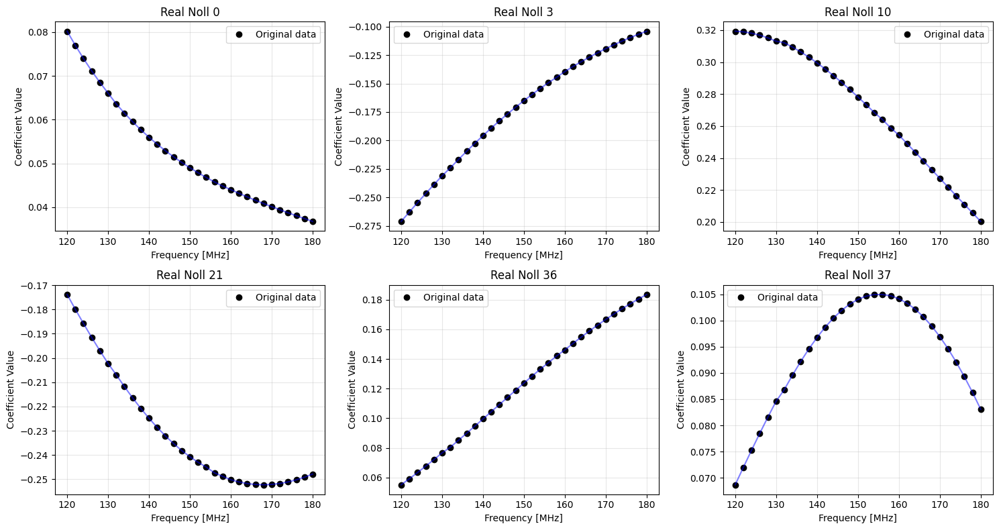

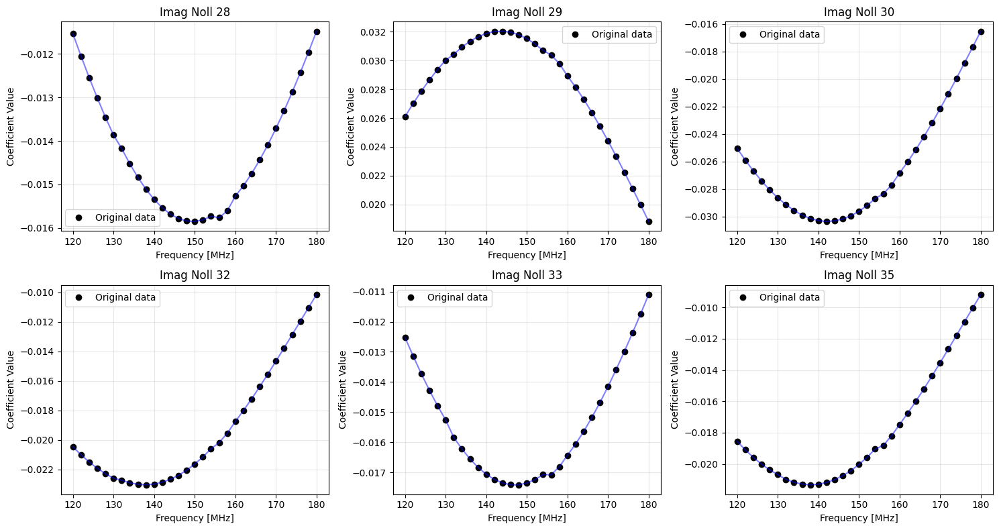

In [61]:
# Prepare your data (you'll need to extract from your text format)
freq = np.arange(start_freq,end_freq+1,interval)  # Your frequency array

# Extract from your Noll index data
real_noll_indices = recon_coef_comp[:,0,0,0,0]

real_coeffs = recon_coef_comp[:,0,0,1,0]

# Same for imaginary parts
imag_noll_indices = recon_coef_comp[:,0,0,0,1]
imag_coeffs = recon_coef_comp[:,0,0,1,1]

# Run complete analysis
analyzer = analyze_all_zernike_components(
    freqs, real_noll_indices, imag_noll_indices,
    real_coeffs, imag_coeffs, 
    min_coverage=0.5,  # Only analyze coeffs present in ≥70% of freqs
    plot_examples=True
)

#### Using poly+sine

In [27]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import warnings
from collections import defaultdict

class PolySinIndexAwareProcessor:
    """
    Fits poly+sin models to Zernike coefficients with varying Noll indices across frequencies
    Handles the fact that different coefficients appear/disappear at different frequencies
    """
    
    def __init__(self, freqs):
        """
        Initialize with frequency array
        
        Parameters:
        -----------
        freqs : array_like, shape (31,)
            Frequency values in MHz
        """
        self.freqs = np.array(freqs)
        # if len(self.freqs) != 31:
        #     raise ValueError(f"Expected 31 frequencies, got {len(self.freqs)}")
        
        self.fitted_params = {}  # Dict mapping noll_index -> parameters
        self.fit_success = {}    # Dict mapping noll_index -> success boolean
        self.fit_errors = {}     # Dict mapping noll_index -> error message
        self.all_noll_indices = set()
    
    def poly_sin_model(self, freqs, A0, Ainv, A1, A2, A_sin, f0, phi):
        """Polynomial + sinusoidal model: A0 + A1/f + A2*f + A3*f^2 + A_sin*sin(2πf/f0 + φ)"""
        return A0 + Ainv / (freqs + 1e-12) + A1*freqs + A2*freqs**2 + A_sin * np.sin(2*np.pi*freqs / f0 + phi)
    
    def extract_coefficient_timeseries(self, indices_matrix, coeffs_matrix):
        """
        Extract time series for each unique Noll index from varying-index matrices
        
        Parameters:
        -----------
        indices_matrix : array_like, shape (31, 26)
            Noll indices at each frequency
        coeffs_matrix : array_like, shape (31, 26)
            Coefficient values at each frequency
            
        Returns:
        --------
        dict: {noll_index: {'freqs': array, 'values': array, 'coverage': fraction}}
        """
        indices_matrix = np.array(indices_matrix)
        coeffs_matrix = np.array(coeffs_matrix)
        
        if indices_matrix.shape != coeffs_matrix.shape:
            raise ValueError("Shape of coeffs and indices matrices don't match")
        
        coefficient_data = defaultdict(lambda: {'freqs': [], 'values': [], 'freq_indices': []})
        
        # Extract data for each unique Noll index
        for freq_idx in range(indices_matrix.shape[0]):
            for coeff_idx in range(indices_matrix.shape[1]):
                noll_index = indices_matrix[freq_idx, coeff_idx]
                
                # Skip NaN indices
                if np.isnan(noll_index):
                    continue
                    
                noll_index = int(noll_index)  # Convert to int for dict key
                coefficient_data[noll_index]['freqs'].append(self.freqs[freq_idx])
                coefficient_data[noll_index]['values'].append(coeffs_matrix[freq_idx, coeff_idx])
                coefficient_data[noll_index]['freq_indices'].append(freq_idx)
        
        # Convert to numpy arrays and calculate coverage
        processed_data = {}
        for noll_index, data in coefficient_data.items():
            if len(data['freqs']) > 0:
                processed_data[noll_index] = {
                    'freqs': np.array(data['freqs']),
                    'values': np.array(data['values']),
                    'freq_indices': np.array(data['freq_indices']),
                    'coverage': len(data['freqs']) / indices_matrix.shape[0]  # Fraction of frequencies where this coeff appears
                }
                self.all_noll_indices.add(noll_index)
        
        return processed_data
    
    def fit_single_coefficient(self, freqs, values, noll_index, max_attempts=3):
        """
        Fit poly+sin model to a single coefficient time series
        """
        # Handle insufficient data
        if len(freqs) < 7:  # Need at least 7 points for 7 parameters
            return np.full(7, np.nan), False, f"Insufficient data: only {len(freqs)} points"
        
        # Handle NaN values
        valid_mask = ~np.isnan(values)
        if np.sum(valid_mask) < 7: 
            return np.full(7, np.nan), False, "Insufficient valid data points after NaN removal"
        
        freqs_clean = freqs[valid_mask]
        values_clean = values[valid_mask]
        
        # Multiple initialization strategies
        init_strategies = []
        
        # Strategy 1: Data-driven initialization
        A0_guess = np.median(values_clean)
        if len(freqs_clean) > 1:
            A1_guess = (values_clean[-1] - values_clean[0]) / (freqs_clean[-1] - freqs_clean[0])
        else:
            A1_guess = 0.0
        A2_guess = 0.0
        Ainv_guess = 0.0
        A_sin_guess = 0.5 * np.std(values_clean)
        f0_guess = 2 * (freqs_clean[-1] - freqs_clean[0]) if len(freqs_clean) > 1 else 60
        phi_guess = 0.0
        init_strategies.append([A0_guess, Ainv_guess, A1_guess, A2_guess, A_sin_guess, f0_guess, phi_guess])
        
        # Strategy 2: Conservative initialization
        init_strategies.append([np.mean(values_clean), 0, 0, 0, 0.1*np.std(values_clean), 60, 0])
        
        # Strategy 3: Alternative frequency guess
        f0_alt = max(30, (freqs_clean[-1] - freqs_clean[0]) / 2) if len(freqs_clean) > 1 else 30
        init_strategies.append([A0_guess, Ainv_guess, A1_guess, A2_guess, A_sin_guess, f0_alt, np.pi/2])
        
        # Bounds
        val_range = np.max(values_clean) - np.min(values_clean)
        f_range = freqs_clean[-1] - freqs_clean[0] if len(freqs_clean) > 1 else 60
        
        lower_bounds = [-np.inf, -np.inf, -np.inf, -np.inf, -10*max(val_range, 1e-6), max(f_range/20, 5), -2*np.pi]
        upper_bounds = [ np.inf,  np.inf,  np.inf,  np.inf,  10*max(val_range, 1e-6), f_range*5, 2*np.pi]
        
        best_params = None
        best_error = np.inf
        success = False
        
        for attempt, p0 in enumerate(init_strategies[:max_attempts]):
            try:
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")
                    popt, pcov = curve_fit(
                        self.poly_sin_model, freqs_clean, values_clean,
                        p0=p0, bounds=(lower_bounds, upper_bounds),
                        maxfev=10000, method='trf'
                    )
                
                # Evaluate fit quality
                pred_values = self.poly_sin_model(freqs_clean, *popt)
                rmse = np.sqrt(np.mean((values_clean - pred_values)**2))
                
                if rmse < best_error:
                    best_error = rmse
                    best_params = popt.copy()
                    success = True
                    
            except Exception as e:
                continue
        
        if success:
            return best_params, True, None
        else:
            return np.full(7, np.nan), False, "All fitting attempts failed"
    
    def fit_matrices(self, indices_matrix, coeffs_matrix, min_coverage=0.2, verbose=True):
        """
        Fit poly+sin models to coefficient matrices with varying indices
        
        Parameters:
        -----------
        indices_matrix : array_like, shape (31, 26)
            Noll indices at each frequency/position
        coeffs_matrix : array_like, shape (31, 26)
            Coefficient values at each frequency/position
        min_coverage : float
            Minimum fraction of frequencies a coefficient must appear in to be fitted
        verbose : bool
            Print progress information
            
        Returns:
        --------
        dict: Results containing fitted parameters and diagnostics
        """
        # Extract coefficient time series
        coeff_data = self.extract_coefficient_timeseries(indices_matrix, coeffs_matrix)
        
        # Filter coefficients by coverage
        filtered_coeffs = {noll: data for noll, data in coeff_data.items() 
                          if data['coverage'] >= min_coverage}
        
        if verbose:
            print(f"Found {len(coeff_data)} unique Noll indices")
            print(f"Fitting {len(filtered_coeffs)} coefficients with ≥{min_coverage:.0%} frequency coverage")
            print("Progress: ", end="", flush=True)
        
        n_coeffs = len(filtered_coeffs)
        successful_fits = 0
        
        for i, (noll_index, data) in enumerate(filtered_coeffs.items()):
            if verbose and (i + 1) % max(1, n_coeffs // 10) == 0:
                print(f"{i+1}/{n_coeffs} ", end="", flush=True)
            
            params, success, error = self.fit_single_coefficient(
                data['freqs'], data['values'], noll_index
            )
            
            self.fitted_params[noll_index] = params
            self.fit_success[noll_index] = success
            self.fit_errors[noll_index] = error
            
            if success:
                successful_fits += 1
        
        if verbose:
            print(f"\nCompleted! Successfully fitted {successful_fits}/{n_coeffs} coefficients")
        
        return {
            'coefficient_data': coeff_data,
            'fitted_coefficients': list(self.fitted_params.keys()),
            'n_successful': successful_fits,
            'n_total': n_coeffs,
            'coverage_stats': {noll: data['coverage'] for noll, data in coeff_data.items()}
        }
    
    def reconstruct_matrices(self, target_indices_matrix, freqs=None):
        """
        Reconstruct coefficient matrix using fitted parameters
        
        Parameters:
        -----------
        target_indices_matrix : array_like, shape (M, 26)
            Desired Noll indices layout for reconstruction
        freqs : array_like, optional
            Frequencies for reconstruction. If None, uses original frequencies
            
        Returns:
        --------
        ndarray, shape (M, 26): Reconstructed coefficient matrix
        """
        if freqs is None:
            freqs = self.freqs
        else:
            freqs = np.array(freqs)
        
        target_indices = np.array(target_indices_matrix)
        n_freqs, n_positions = target_indices.shape
        
        reconstructed = np.full((n_freqs, n_positions), np.nan)
        
        for freq_idx in range(n_freqs):
            for pos_idx in range(n_positions):
                noll_index = target_indices[freq_idx, pos_idx]
                
                if np.isnan(noll_index):
                    continue
                    
                noll_index = int(noll_index)
                
                if noll_index in self.fitted_params and self.fit_success.get(noll_index, False):
                    params = self.fitted_params[noll_index]
                    if not np.any(np.isnan(params)):
                        reconstructed[freq_idx, pos_idx] = self.poly_sin_model(
                            freqs[freq_idx], *params
                        )
        
        reconstructed[np.isnan(reconstructed)] = 0
        
        return reconstructed
    
    def get_fitted_parameters_matrix(self):
        """
        Export fitted parameters as a structured matrix
        
        Returns:
        --------
        tuple: (noll_indices_array, parameters_matrix, success_mask)
        """
        successful_nolls = [noll for noll, success in self.fit_success.items() if success]
        successful_nolls.sort()
        
        if not successful_nolls:
            return np.array([]), np.array([]).reshape(0, 7), np.array([])
        
        noll_array = np.array(successful_nolls)
        param_matrix = np.array([self.fitted_params[noll] for noll in successful_nolls])
        success_array = np.array([self.fit_success[noll] for noll in successful_nolls])
        
        return noll_array, param_matrix, success_array
    
    def plot_fit_examples(self, coeff_data, max_plots=6):
        """Plot examples of fits for visual inspection"""
        successful_fits = {noll: params for noll, params in self.fitted_params.items() 
                         if self.fit_success.get(noll, False)}
        
        if not successful_fits:
            print("No successful fits to plot")
            return
        
        # Select examples with good coverage
        plot_nolls = sorted(successful_fits.keys())[:max_plots]
        
        n_plots = min(len(plot_nolls), max_plots)
        n_cols = min(3, n_plots)
        n_rows = (n_plots + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
        if n_plots == 1:
            axes = [axes]
        elif n_rows == 1 and n_cols > 1:
            axes = axes.flatten()
        elif n_rows > 1:
            axes = axes.flatten()
        
        for i, noll_index in enumerate(plot_nolls):
            if i >= len(axes):
                break
                
            ax = axes[i]
            
            # Get data for this coefficient
            data = coeff_data[noll_index]
            freqs_coeff = data['freqs']
            values_coeff = data['values']
            
            # Plot original data
            ax.plot(freqs_coeff, values_coeff, 'ko', markersize=4, label='Data')
            
            # Plot fitted curve
            params = self.fitted_params[noll_index]
            freq_fine = np.linspace(freqs_coeff.min(), freqs_coeff.max(), 100)
            fitted_fine = self.poly_sin_model(freq_fine, *params)
            ax.plot(freq_fine, fitted_fine, 'r-', linewidth=2, label='Poly+Sin fit')
            
            # Calculate RMSE
            fitted_values = self.poly_sin_model(freqs_coeff, *params)
            rmse = np.sqrt(np.mean((values_coeff - fitted_values)**2))
            
            # Title with info
            A0, Ainv, A1, A2, A_sin, f0, phi = params
            coverage = data['coverage']
            title = f'Noll {noll_index} (coverage: {coverage:.0%})\nRMSE: {rmse:.2e}, f₀={f0:.1f}'
            
            ax.set_title(title, fontsize=10)
            ax.set_xlabel('Frequency [MHz]')
            ax.set_ylabel('Coefficient Value')
            ax.grid(True, alpha=0.3)
            ax.legend()
        
        # Hide unused subplots
        if n_plots < len(axes):
            for i in range(n_plots, len(axes)):
                axes[i].set_visible(False)
        
        plt.tight_layout()
        plt.show()

# Convenience functions
def fit_zernike_with_indices(freqs, indices_matrix, coeffs_matrix, min_coverage=0.3, verbose=True, plot_examples=False):
    """
    Fit poly+sin models to Zernike coefficients with varying indices
    
    Parameters:
    -----------
    freqs : array_like, shape (31,)
        Frequency values
    indices_matrix : array_like, shape (31, 26)
        Noll indices at each frequency/position
    coeffs_matrix : array_like, shape (31, 26)
        Coefficient values at each frequency/position
    min_coverage : float
        Minimum frequency coverage required to fit a coefficient
    
    Returns:
    --------
    dict: Complete results including processor and fitted parameters
    """
    processor = PolySinIndexAwareProcessor(freqs)
    results = processor.fit_matrices(indices_matrix, coeffs_matrix, min_coverage, verbose)
    
    # Get structured parameter output
    noll_indices, param_matrix, success_mask = processor.get_fitted_parameters_matrix()
    
    if plot_examples and results['n_successful'] > 0:
        processor.plot_fit_examples(results['coefficient_data'], noll_indices.shape[0])
    
    results.update({
        'processor': processor,
        'noll_indices': noll_indices,          # Shape: (N,) - which Noll indices were fitted
        'fitted_params': param_matrix,         # Shape: (N, 7) - the poly+sin parameters
        'success_mask': success_mask,          # Shape: (N,) - which fits succeeded
        'compression_info': {
            'original_elements': indices_matrix.shape[0] * indices_matrix.shape[-1],
            'fitted_params': len(noll_indices) * 7,
            'compression_ratio': (indices_matrix.shape[0] * indices_matrix.shape[-1]) / (len(noll_indices) * 7) if len(noll_indices) > 0 else 0
        }
    })
    
    if verbose:
        comp_info = results['compression_info']
        print(f"Compression: {comp_info['compression_ratio']:.1f}:1")
        print(f"Storage: {comp_info['original_elements']} → {comp_info['fitted_params']} parameters")
    
    return results

def reconstruct_with_indices(noll_indices, fitted_params, target_indices_matrix, freqs_original, freqs_new=None):
    """
    Reconstruct coefficient matrix from poly+sin parameters with index mapping
    """
    processor = PolySinIndexAwareProcessor(freqs_original)
    
    # Load fitted parameters
    for i, noll_idx in enumerate(noll_indices):
        processor.fitted_params[int(noll_idx)] = fitted_params[i]
        processor.fit_success[int(noll_idx)] = True
    
    return processor.reconstruct_matrices(target_indices_matrix, freqs_new)

# # Example usage
# if __name__ == "__main__":
#     print("=== Example: Index-aware Zernike coefficient fitting ===")
    
#     # Create example data
#     freqs = np.linspace(120, 180, 31)
    
#     # Simulate varying Noll indices (some coefficients appear/disappear)
#     base_nolls = np.array([0, 1, 3, 4, 6, 7, 9, 10, 11, 12, 14, 19, 21, 
#                           23, 24, 25, 26, 29, 30, 36, 37, 39, 40, 41, 42, 44])
    
#     indices_matrix = np.tile(base_nolls, (31, 1))
#     # Add some variation - some coefficients disappear at certain frequencies
#     indices_matrix[10:15, -3:] = np.nan  # Some coeffs disappear mid-frequency
#     indices_matrix[:5, :3] = np.nan      # Some coeffs missing at start
    
#     # Create synthetic coefficient matrix
#     np.random.seed(42)
#     coeffs_matrix = np.random.normal(0, 0.01, (31, 26))
    
#     # Add realistic spectral behavior for non-NaN entries
#     for i in range(31):
#         for j in range(26):
#             if not np.isnan(indices_matrix[i, j]):
#                 noll = int(indices_matrix[i, j])
#                 # Different behavior per Noll index
#                 coeffs_matrix[i, j] = (0.001 * np.sin(2*np.pi*freqs[i]/50 + noll) + 
#                                      0.002 / freqs[i] + noll * 1e-5)
    
#     # Set corresponding coefficients to NaN where indices are NaN
#     coeffs_matrix[np.isnan(indices_matrix)] = np.nan
    
#     # Fit the models
#     results = fit_zernike_with_indices(freqs, indices_matrix, coeffs_matrix, 
#                                      min_coverage=0.5, verbose=True, plot_examples=True)
    
#     # Test reconstruction
#     reconstructed = reconstruct_with_indices(
#         results['noll_indices'], results['fitted_params'],
#         indices_matrix, freqs
#     )
    
#     # Calculate reconstruction error for valid entries
#     valid_mask = ~np.isnan(coeffs_matrix)
#     if np.any(valid_mask):
#         orig_valid = coeffs_matrix[valid_mask]
#         recon_valid = reconstructed[valid_mask]
#         rmse = np.sqrt(np.mean((orig_valid - recon_valid)**2))
#         print(f"\nReconstruction RMSE: {rmse:.2e}")

In [28]:
# Your actual data structure
freqs = np.arange(start_freq,end_freq+1,interval)  # 31 frequencies
coef_comp = np.load(dout + 'recon_coef_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))

# Real part
real_indices = coef_comp[:,0,0,0,0]     # Shape: (31, 26)
real_coef = coef_comp[:,0,0,1,0]     # Shape: (31, 26)

# Imaginary part
img_indices = coef_comp[:,0,0,0,1]     # Shape: (31, 26)
img_coef = coef_comp[:,0,0,1,1]     # Shape: (31, 26)

# Fit poly+sin models
real_results = fit_zernike_with_indices(
    freqs, real_indices, real_coef, 
    min_coverage=0.5,  # Fit coeffs present in ≥50% of frequencies
    verbose=True, plot_examples=False
)

img_results = fit_zernike_with_indices(
    freqs, img_indices, img_coef, 
    min_coverage=0.5,  # Fit coeffs present in ≥50% of frequencies
    verbose=True, plot_examples=False
)

# Get compressed representation
real_noll = real_results['noll_indices']      # Which coeffs fitted
real_fitted_params = real_results['fitted_params']    # Their poly+sin parameters

img_noll = img_results['noll_indices']      # Which coeffs fitted
img_fitted_params = img_results['fitted_params']    # Their poly+sin parameters

# Reconstruct original matrices
recon_real = reconstruct_with_indices(
    real_noll, real_fitted_params,
    real_indices, freqs  # Use original index layout
)

recon_img = reconstruct_with_indices(
    img_noll, img_fitted_params,
    img_indices, freqs  # Use original index layout
)

Found 46 unique Noll indices
Fitting 25 coefficients with ≥50% frequency coverage
Progress: 2/25 4/25 6/25 8/25 10/25 12/25 14/25 16/25 18/25 20/25 22/25 24/25 
Completed! Successfully fitted 25/25 coefficients
Compression: 4.6:1
Storage: 806 → 175 parameters
Found 44 unique Noll indices
Fitting 26 coefficients with ≥50% frequency coverage
Progress: 2/26 4/26 6/26 8/26 10/26 12/26 14/26 16/26 18/26 20/26 22/26 24/26 26/26 
Completed! Successfully fitted 26/26 coefficients
Compression: 4.4:1
Storage: 806 → 182 parameters


In [29]:
recon_coef = [recon_real, recon_img]
recon_coef = np.array(recon_coef)
#recon_coef[np.isnan(recon_coef)]=0
print(recon_coef.shape)

(2, 31, 26)


(2, 26)
(2, 26)


/tmp/ipykernel_3380/758330571.py:7: RuntimeWarning: divide by zero encountered in log10
  imgs = 20*np.log10(np.array([Jz[0], Jz[1], res]))


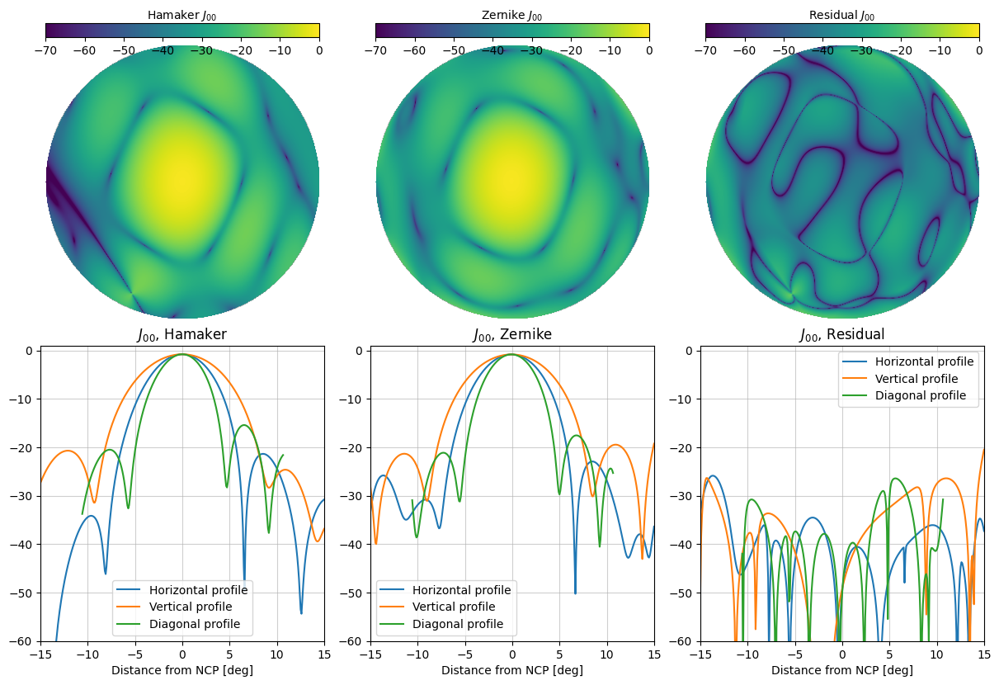

In [30]:
J = Jz_comp[5]
print(recon_coef[:,5,:].shape)
print(recon_coef_comp[5,0,0,0].shape)
Jzr = zernike_recon(J[0,:,:,0,0], recon_coef[:,5,:], recon_coef_comp[5,0,0,0])
zernike_plot(Jzr,0,0)

In [46]:
def zernike_spectral_compression(freqs, coef, min_coverage = 0.5):

    coef_compressed = {}
    
    for i in range(2):
        for j in range(2):
            
            real_ind = coef[:,i,j,0,0]     
            real_coef = coef[:,i,j,1,0]     
            
            img_ind = coef[:,i,j,0,1]  
            img_coef = coef[:,i,j,1,1]     

            print(f"Compressing for J_{i}{j}")
            # Fit poly+sin models
            print("Compressing real components")
            real_results = fit_zernike_with_indices(
                freqs, real_ind, real_coef, 
                min_coverage,  
                verbose=True, plot_examples=False
            )

            print("Compressing imaginary components")
            img_results = fit_zernike_with_indices(
                freqs, img_ind, img_coef, 
                min_coverage,  
                verbose=True, plot_examples=False
            )

            # Get compressed representation
            real_noll = real_results['noll_indices']      # Which coeffs fitted
            real_params = real_results['fitted_params']    # Their poly+sin parameters
            
            img_noll = img_results['noll_indices']      # Which coeffs fitted
            img_params = img_results['fitted_params']    # Their poly+sin parameters

            coef_compressed[(i, j, 0)] = {int(real_noll[k]): real_params[k] for k in range(len(real_noll))}
            coef_compressed[(i, j, 1)] = {int(img_noll[k]): img_params[k] for k in range(len(img_noll))}

    return coef_compressed

In [45]:
def zernike_spectral_recon(freqs, coef, coef_compressed):

    coef_recon = np.empty((len(freqs),2,2,2,2,coef.shape[-1]))
    for i in range(2):
        for j in range(2):

            real_noll = np.array(list(coef_compressed[(i,j,0)].keys()))
            real_params = np.array(list(coef_compressed[(i,j,0)].values()))
            real_ind = coef[:,i,j,0,0]

            img_noll = np.array(list(coef_compressed[(i,j,1)].keys()))
            img_params = np.array(list(coef_compressed[(i,j,1)].values()))
            img_ind = coef[:,i,j,0,1]
            
            recon_real = reconstruct_with_indices(
                real_noll, real_params,
                real_ind, freqs  # Use original index layout
            )
        
            recon_img = reconstruct_with_indices(
                img_noll, img_params,
                img_ind, freqs  # Use original index layout
            )

            coef_recon[:,i,j,0,0] = real_ind
            coef_recon[:,i,j,1,0] = recon_real
            
            coef_recon[:,i,j,0,1] = img_ind
            coef_recon[:,i,j,1,1] = recon_img

    return coef_recon

In [49]:
freqs = np.arange(start_freq,end_freq+1,interval)  
coef_comp = np.load(dout + 'recon_coef_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))

coef_compressed = zernike_spectral_compression(freqs, coef_comp)
coef_recon = zernike_spectral_recon(freqs, coef_comp, coef_compressed)

Compressing for J_00
Compressing real components
Found 46 unique Noll indices
Fitting 25 coefficients with ≥50% frequency coverage
Progress: 2/25 4/25 6/25 8/25 10/25 12/25 14/25 16/25 18/25 20/25 22/25 24/25 
Completed! Successfully fitted 25/25 coefficients
Compression: 4.6:1
Storage: 806 → 175 parameters
Compressing imaginary components
Found 44 unique Noll indices
Fitting 26 coefficients with ≥50% frequency coverage
Progress: 2/26 4/26 6/26 8/26 10/26 12/26 14/26 16/26 18/26 20/26 22/26 24/26 26/26 
Completed! Successfully fitted 26/26 coefficients
Compression: 4.4:1
Storage: 806 → 182 parameters
Compressing for J_01
Compressing real components
Found 49 unique Noll indices
Fitting 26 coefficients with ≥50% frequency coverage
Progress: 2/26 4/26 6/26 8/26 10/26 12/26 14/26 16/26 18/26 20/26 22/26 24/26 26/26 
Completed! Successfully fitted 26/26 coefficients
Compression: 4.4:1
Storage: 806 → 182 parameters
Compressing imaginary components
Found 49 unique Noll indices
Fitting 25 coef

In [50]:
np.save(dout + 'coef_compressed_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval), coef_compressed)
np.save(dout + 'coef_reconstructed_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval), coef_recon)

/tmp/ipykernel_3380/758330571.py:7: RuntimeWarning: divide by zero encountered in log10
  imgs = 20*np.log10(np.array([Jz[0], Jz[1], res]))


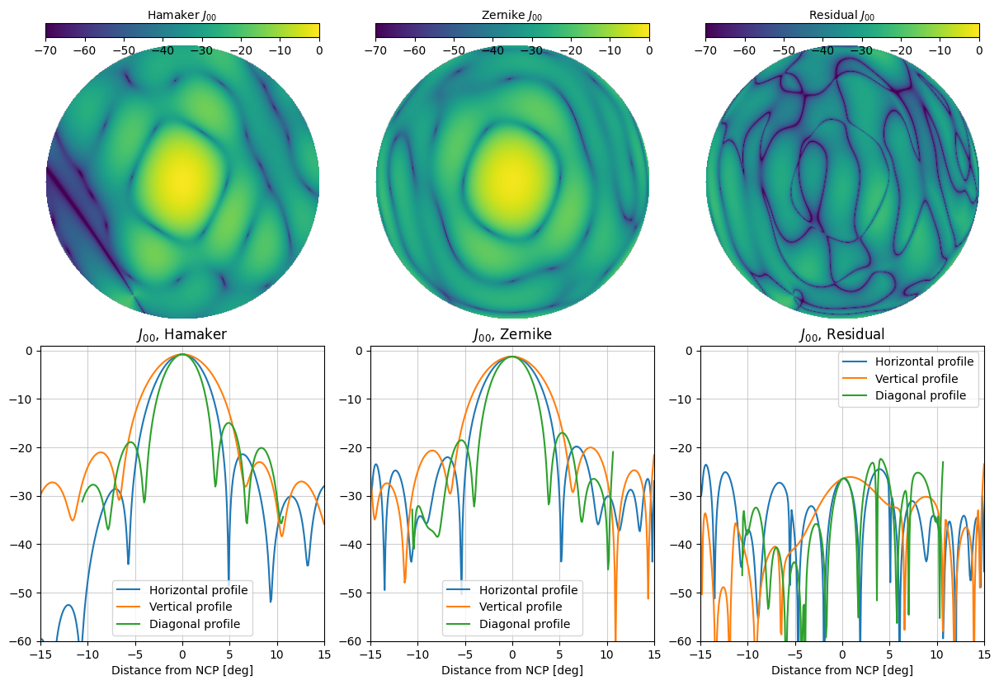

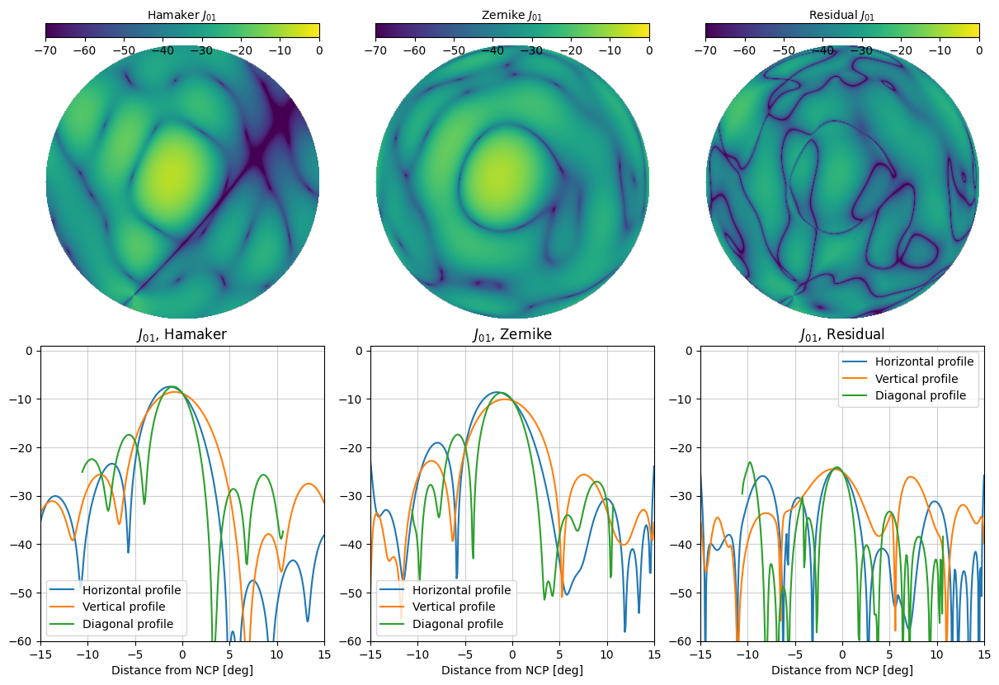

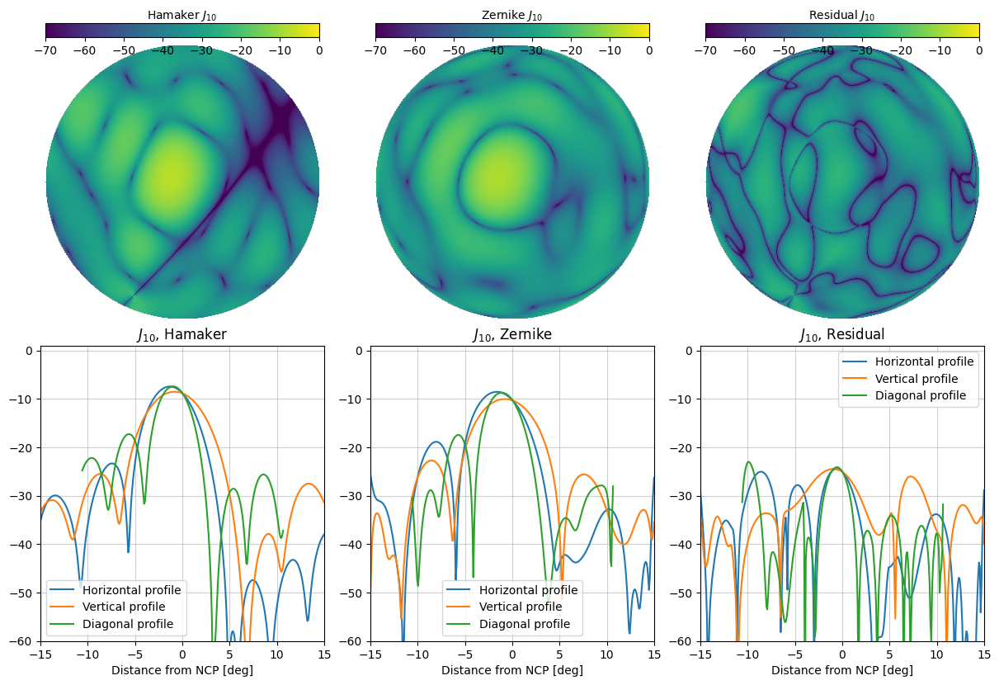

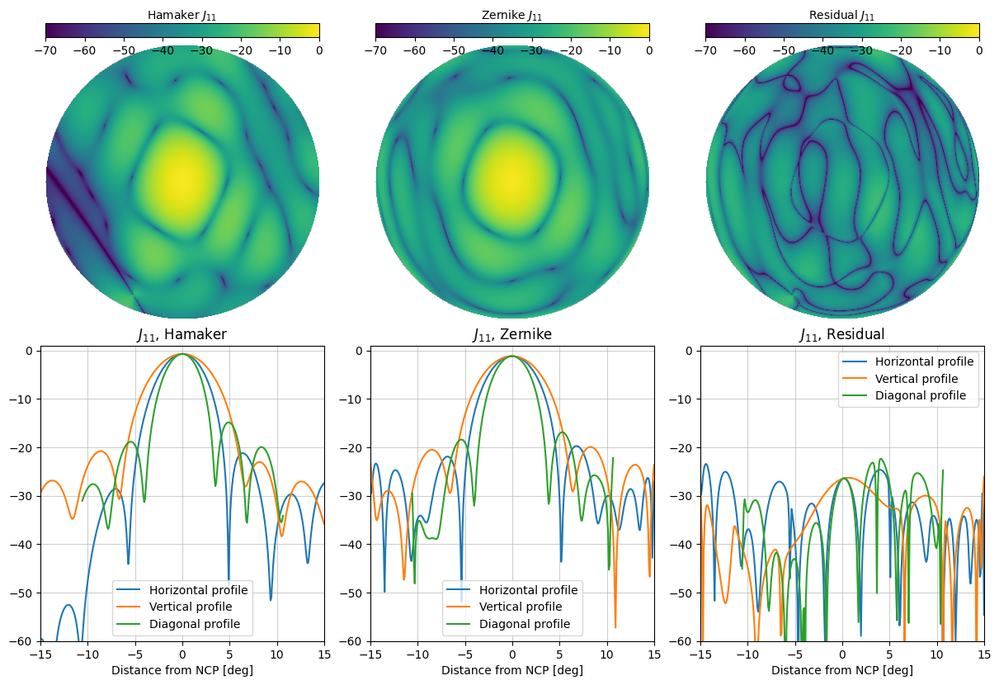

In [71]:
coef_recon = np.load(dout + 'coef_reconstructed_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))

coef = coef_recon[30]
J = J_comp[30]
# Jz = J[cy-r:cy+r, cx-r:cx+r, :, :]

for i in range(2):
    for j in range(2):
        Jzr = zernike_recon(J[:,:,j,i], coef[i][j])
        zernike_plot(Jzr,i,j)

In [64]:
Jz_recon_comp = []


for f in range(len(freqs)):
    
    coef = coef_recon[f]
    J = J_comp[f]
    # Jz = J[cy-r:cy+r, cx-r:cx+r, :, :]
    
    Jz_db = np.empty((2,J.shape[0],J.shape[0],2,2))
    
    for i in range(2):
        for j in range(2):
            Jzr = zernike_recon(J[:,:,j,i], coef[i][j]);
            print(f'Jones_%i%i_done'%(i,j))
            #recom_coef[i][j] = recom
            Jz_db[:,:,:,j,i] = Jzr
            
    print(f'Freq_%i_done'%(start_freq + interval*f))
    Jz_recon_comp.append(Jz_db)

Jz_recon_comp = np.array(Jz_recon_comp)

Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_120_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_122_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_124_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_126_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_128_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_130_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_132_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_134_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_136_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_138_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_140_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_142_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_144_done
Jones_00_done
Jones_01_done
Jones_10_done
Jones_11_done
Freq_146_done
Jones_00_done
Jones_

In [65]:
np.save(dout + 'Jz_reconstructed_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval), Jz_recon_comp)

/tmp/ipykernel_3380/758330571.py:7: RuntimeWarning: divide by zero encountered in log10
  imgs = 20*np.log10(np.array([Jz[0], Jz[1], res]))


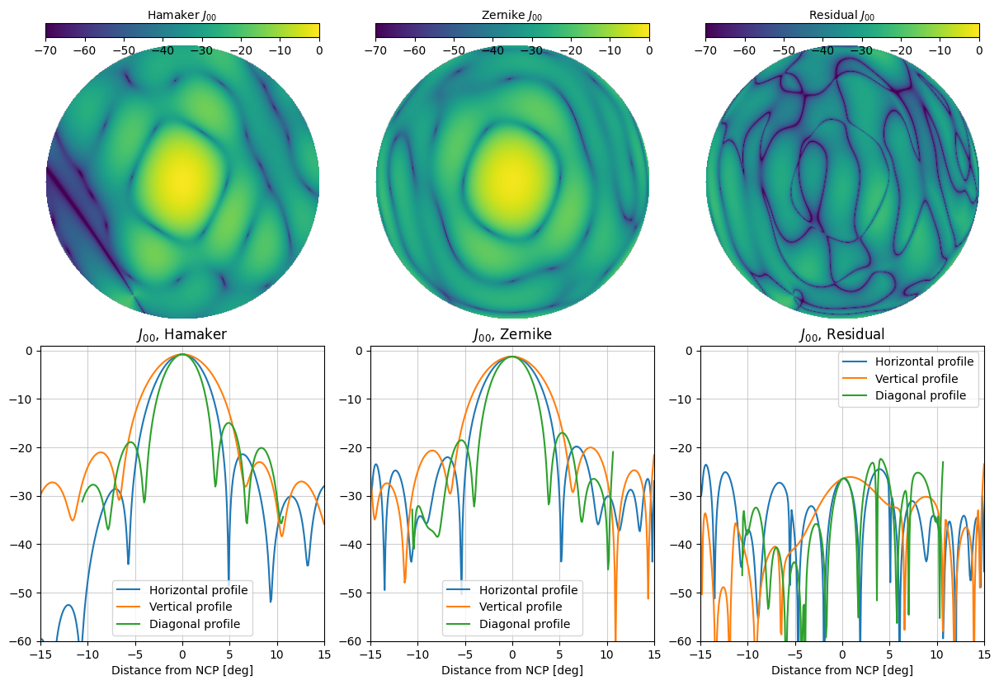

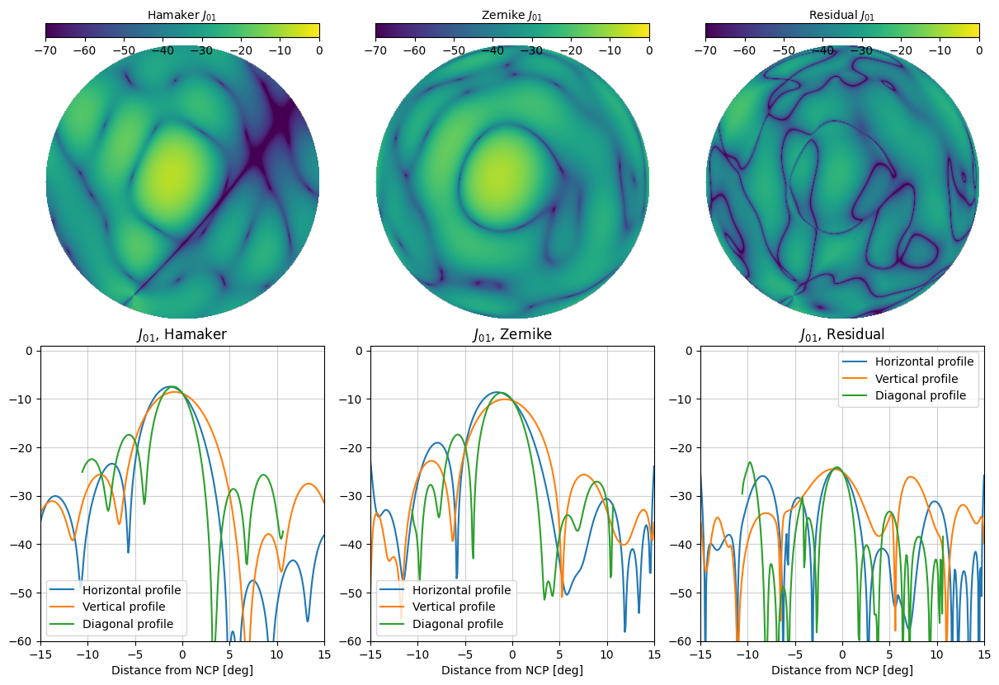

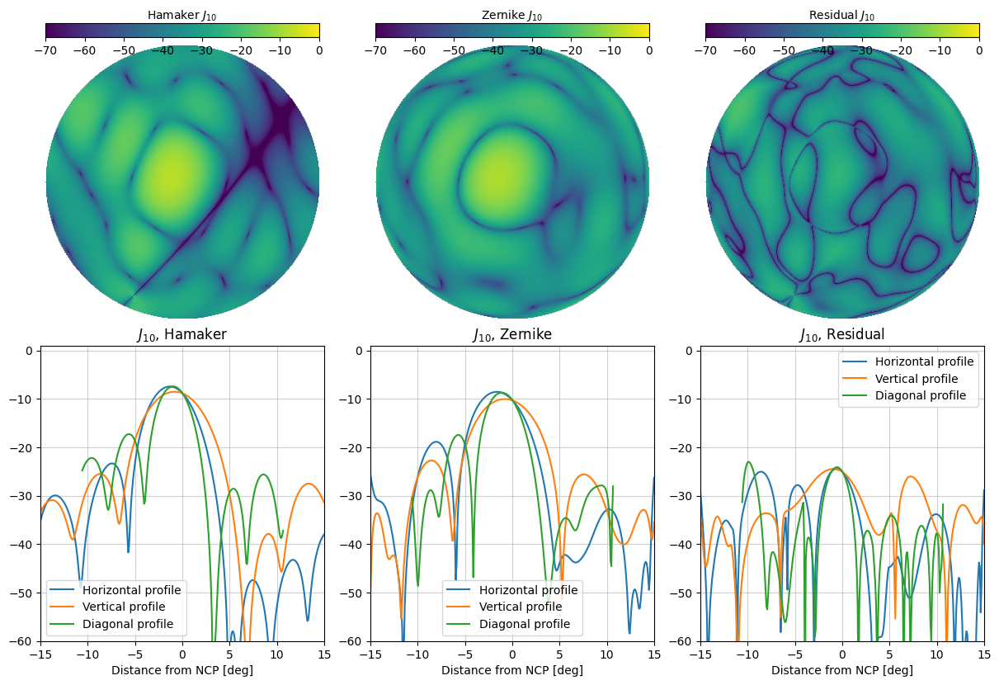

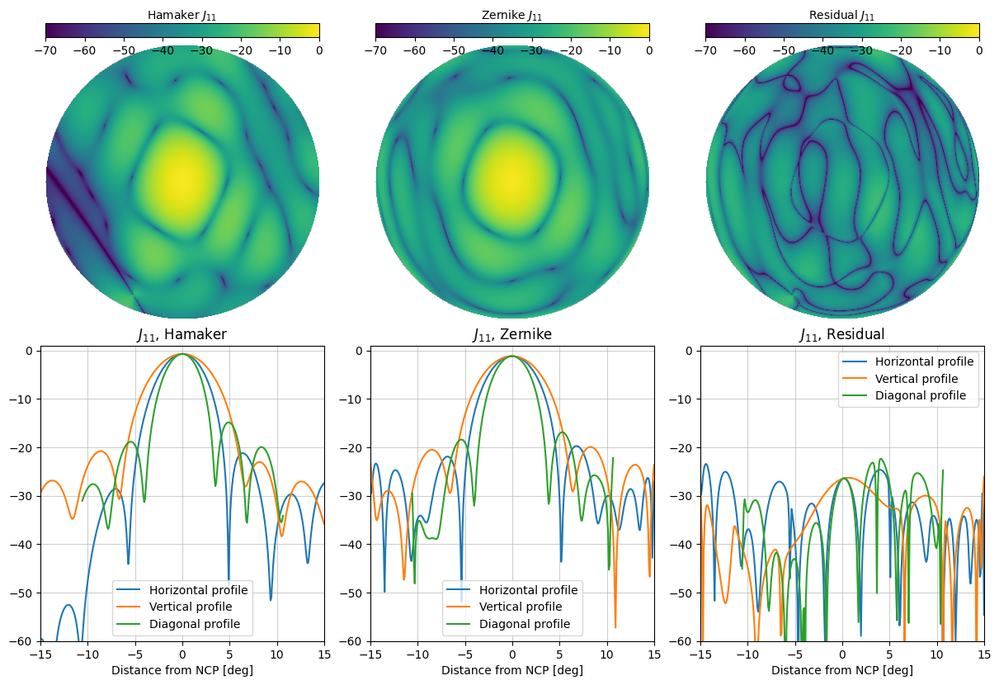

In [72]:
Jz_recon_comp = np.load(dout + 'Jz_reconstructed_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))
                   
for i in range(2):
    for j in range(2):
        zernike_plot(Jz_recon[30,:,:,:,j,i],i,j)

In [86]:
Jz_recon_comp = np.load(dout + 'Jz_reconstructed_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))

num_freq = Jz_recon_comp.shape[0]

mrse_comp = []

for f in range(num_freq):
    mrse_polar = np.empty((2,2))
    Jz = Jz_recon_comp[f]
    data = Jz[0]
    mod = Jz[1]
    
    for i in range(2):
        for j in range(2):
            
            res = np.abs(data[:,:,j,i] - mod[:,:,j,i])
            mrse = np.sqrt(np.mean(res**2))/np.mean(data[:,:,j,i])
            mrse_polar[i][j] = mrse

    mrse_comp.append(mrse_polar)

mrse_comp = np.array(mrse_comp)

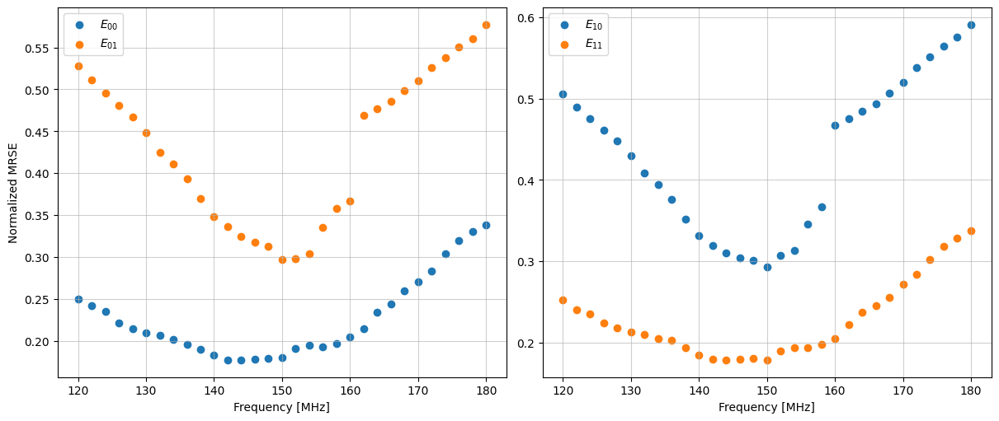

In [87]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

#interval = 5
freq = np.arange(start_freq,end_freq+1,interval)

for i in range(2):
    for j in range(2):
        ax[i].scatter(freq, mrse_comp[:,i,j], label="$E_{%i%i}$"%(i,j))

    ax[i].set_xlabel('Frequency [MHz]')
    # ax[i].set_ylim([0,0.5])
    # ax[i].set_xlim([20,80])
    ax[i].grid(alpha=.6)
    ax[i].legend()    

ax[0].set_ylabel('Normalized MRSE')
plt.show()

### Freq-averaged energies for top strongest zernike coeffs

In [44]:
coef_comp = np.load(dout + 'recon_coef_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))
ener_comp = coef_comp[:,:,:,1,:,:]**2
coef_avg = np.mean(coef_comp[:,:,:,1,:,:], axis=0)
print(coef_avg.shape)
ener_avg = coef_avg**2

num_freq = coef_comp.shape[0]
num_coef = coef_comp.shape[-1]

#interval = 5
freq = np.arange(start_freq,end_freq+1,interval)

sortind_noll = np.empty((2,2,2,num_coef))    
sortind_nm = np.empty((2,2,2,num_coef,2))
for i in range(2):
    for j in range(2):
        cr = coef_avg[i][j][0]
        ci = coef_avg[i][j][1]
        sort_cr = np.argsort(np.abs(cr))[::-1]
        sort_ci = np.argsort(np.abs(ci))[::-1]
        sortind_noll[i][j] = np.array([sort_cr, sort_ci])

        sort_cr = [zernike.noll_to_zern(noll) for noll in sort_cr]
        sort_ci = [zernike.noll_to_zern(noll) for noll in sort_ci]
        sortind_nm[i][j] = np.array([sort_cr, sort_ci])

sortind_noll = sortind_noll.astype(int)
sortind_nm = sortind_nm.astype(int)

(2, 2, 2, 26)


In [261]:
np.save(dout + 'sortind_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval), sortind_noll)
print(sortind_noll.shape)

(2, 2, 2, 26)


In [18]:
def index_to_nm(J):
    """
    Convert multidimensional array of Zernike indices to (n, m) pairs
    
    Parameters:
    J : numpy.ndarray of any shape containing integer indices
    
    Returns:
    n : numpy.ndarray of same shape as J, containing radial orders
    m : numpy.ndarray of same shape as J, containing azimuthal frequencies
    """
    # Flatten the input for processing, but remember original shape
    original_shape = J.shape
    J_flat = J.flatten()
    
    # Find radial order n for all indices
    n_flat = np.floor((-1 + np.sqrt(1 + 8*J_flat)) / 2).astype(int)
    
    # Find position k within each radial order
    k_flat = J_flat - n_flat * (n_flat + 1) // 2
    
    # Find azimuthal frequency m
    m_flat = np.where(k_flat % 2 == 0, 
                      -n_flat + k_flat,     # even k
                      n_flat - k_flat)      # odd k
    
    # Reshape back to original shape
    n = n_flat.reshape(original_shape)
    m = m_flat.reshape(original_shape)
    
    return n, m

In [14]:
sortind_n, sortind_m = index_to_nm(sortind_polar)
sortind_n.shape

(2, 2, 2, 300)

In [18]:
sortind_n = np.empty((2,2,2,300)).astype(int)
sortind_m = np.empty((2,2,2,300)).astype(int)

for i in range(2):
    for j in range(2):
        for k in range(modes):
            (sortind_n[i][j][0][k],sortind_m[i][j][0][k]) = zernike.noll_to_zern(
                sortind_polar[i][j][0][k])

            (sortind_n[i][j][1][k],sortind_m[i][j][1][k]) = zernike.noll_to_zern(
                sortind_polar[i][j][1][k])

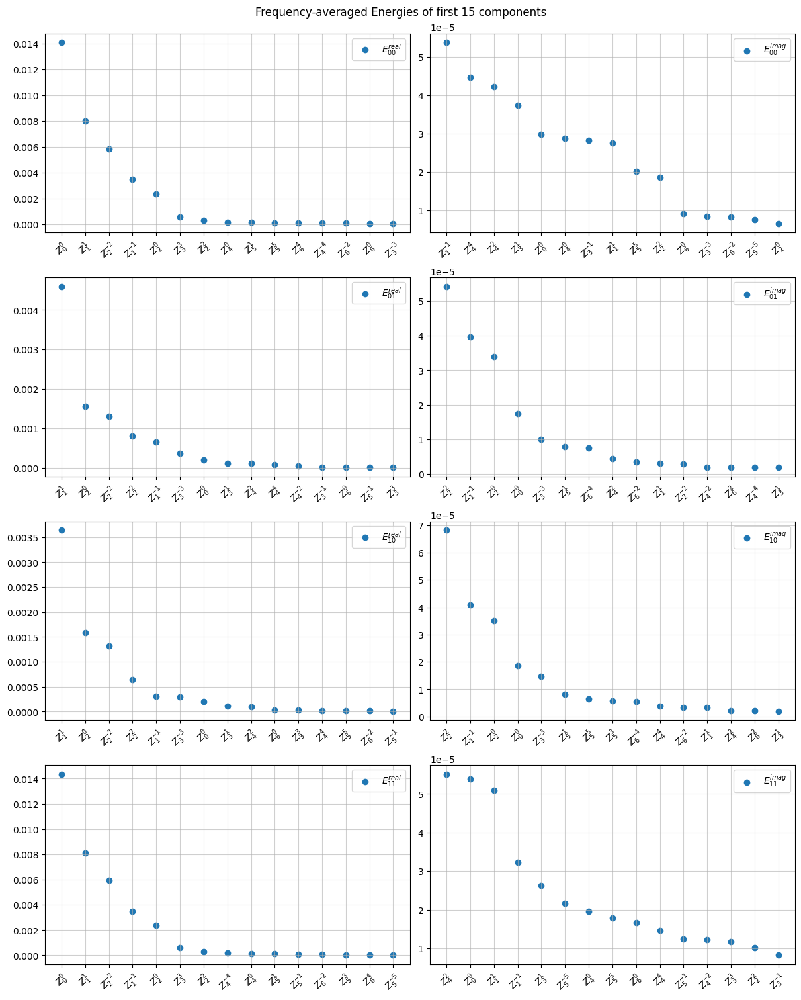

In [250]:
fig, ax = plt.subplots(4, 2, figsize=(12, 15), constrained_layout=True)

num_coef = 15

trun_sortind_noll = sortind_noll[:,:,:,:num_coef]
trun_sortind_nm = sortind_nm[:,:,:,:num_coef,:]
# trun_sortind_n = sortind_n[:,:,:,0:num_coef]
# trun_sortind_m = sortind_m[:,:,:,0:num_coef]

for i in range(4):
    r = i//2
    c = i%2
    ax[i][0].scatter(range(num_coef),ener_avg[r,c,0,trun_sortind_noll[r,c,0]],
                     label="$E_{%i%i}^{real}$"%(r,c))
    ax[i][0].set_xticks(range(num_coef))
    labels_r = [f'$Z_{{{i}}}^{{{j}}}$' for i,j in np.column_stack((trun_sortind_nm[r,c,0,:,0],
                                                                   trun_sortind_nm[r,c,0,:,1]))]
    ax[i][0].set_xticklabels(labels_r, rotation=45)
    ax[i][0].legend()
    ax[i][0].grid(alpha=.6)
    
    ax[i][1].scatter(range(num_coef),ener_avg[r,c,1,trun_sortind_noll[r,c,1]],
                     label="$E_{%i%i}^{imag}$"%(r,c))
    ax[i][1].set_xticks(range(num_coef))
    labels_i = [f'$Z_{{{i}}}^{{{j}}}$' for i,j in np.column_stack((trun_sortind_nm[r,c,1,:,0],
                                                                   trun_sortind_nm[r,c,1,:,1]))]
    ax[i][1].set_xticklabels(labels_i, rotation=45)
    ax[i][1].legend()
    ax[i][1].grid(alpha=.6)
    
    # ax[i].set_xlabel('Frequency [MHz]')
    # ax[i].set_ylim([0,0.5])
    # ax[i].set_xlim([20,80])
    
        

fig.suptitle("Frequency-averaged Energies of first %s components"%num_coef)
plt.show()

### Energies of top strongest zernike coeffs across frequencies

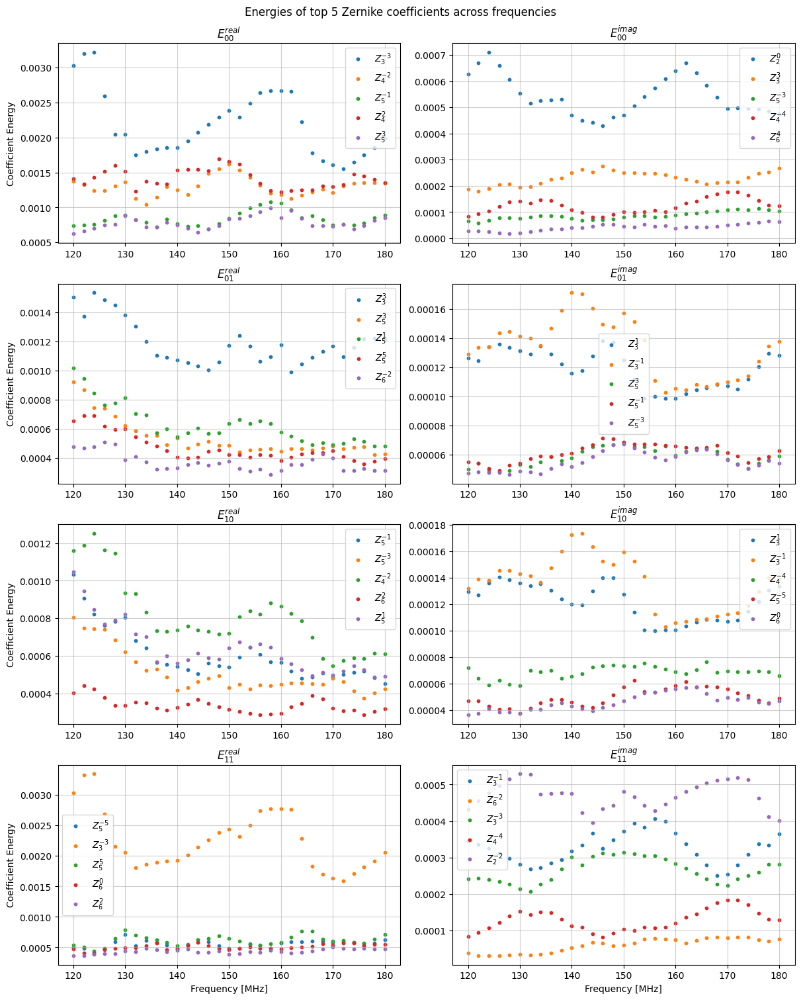

In [45]:
from scipy.ndimage import gaussian_filter1d

#sortind_noll = np.load(dout + 'sortind_HBA_%i_to_%i_with%iInterval.npy'%(start_freq,end_freq,interval))

fig, ax = plt.subplots(4, 2, figsize=(12, 15), constrained_layout=True)

#interval = 5
freq = np.arange(start_freq,end_freq+1,interval)
num_coef = 5
start_coef = 15
startind = start_coef-1

trun_sortind_noll = sortind_noll[:,:,:,startind:startind + num_coef]
trun_sortind_nm = sortind_nm[:,:,:,startind:startind + num_coef,:]
# trun_sortind_n = sortind_n[:,:,:,:num_coef]
# trun_sortind_m = sortind_m[:,:,:,:num_coef]

sigma = 5

for i in range(4):
    r = i//2
    c = i%2
    for j in range(num_coef):
        # ax[i][0].plot(freq,gaussian_filter1d(ener_comp[:,r,c,0,trun_sortind_noll[r,c,0,j]], sigma),
        #               label="$Z_{%i}^{%i}$"%(trun_sortind_nm[r,c,0,j,0],trun_sortind_nm[r,c,0,j,1]))
        ax[i][0].scatter(freq, ener_comp[:,r,c,0,trun_sortind_noll[r,c,0,j]], s = 10,
                      label="$Z_{%i}^{%i}$"%(trun_sortind_nm[r,c,0,j,0],trun_sortind_nm[r,c,0,j,1]))
        
    if r==1 & c==1:
        ax[i][0].set_xlabel('Frequency [MHz]')
        ax[i][1].set_xlabel('Frequency [MHz]')

    ax[i][0].set_title(f'$E_{{{r}{c}}}^{{real}}$')
    ax[i][0].set_ylabel('Coefficient Energy')
    ax[i][0].legend()
    ax[i][0].grid(alpha=.6)
    
    for j in range(num_coef):
        # ax[i][1].plot(freq,gaussian_filter1d(ener_comp[:,r,c,1,trun_sortind_noll[r,c,1,j]], sigma),
        #               label="$Z_{%i}^{%i}$"%(trun_sortind_nm[r,c,1,j,0],trun_sortind_nm[r,c,1,j,1]))
        ax[i][1].scatter(freq, ener_comp[:,r,c,1,trun_sortind_noll[r,c,1,j]], s = 10,
                      label="$Z_{%i}^{%i}$"%(trun_sortind_nm[r,c,1,j,0],trun_sortind_nm[r,c,1,j,1]))
        
    ax[i][1].set_title(f'$E_{{{r}{c}}}^{{imag}}$')
    ax[i][1].legend()
    ax[i][1].grid(alpha=.6)
    # ax[i][1].set_xticks(range(num_coef))
    # labels_i = [f'$Z_{{{i}}}^{{{j}}}$' for i,j in np.column_stack((trun_sortind_n[r,c,1],trun_sortind_m[r,c,1]))]
    # ax[i][1].set_xticklabels(labels_i, rotation=45)
    
    # ax[i].set_ylim([0,0.5])
    # ax[i].set_xlim([20,80])
    
        

fig.suptitle("Energies of top %s Zernike coefficients across frequencies"%num_coef)
plt.show()

### Checking if the sorted noll indices are the same for all frequencies

In [24]:
num_freq = recon_coef_comp.shape[0]

for f in range(num_freq)[1:]:

    a = recon_coef_comp[f-1]
    b = recon_coef_comp[f]

    print('Noll indices of freq %i and %i ---'%(f-1,f))
    
    a = a[0][0][0]
    b = b[0][0][0]

    print('Real Noll indices')
    
    print(a[0])
    print(b[0])

    print('Imaginary Noll indices')
    
    print(a[1])
    print(b[1])

    print('After sorting')

    a = np.sort(a)
    b = np.sort(b)

    print('Real Noll indices')
    
    print(a[0])
    print(b[0])

    print('Imaginary Noll indices')
    
    print(a[1])
    print(b[1])

    # Check exact equality
    print("Real Noll indices of freq %i and %i equal:"%(f-1,f), np.array_equal(a[0],b[0]))

    # Check exact equality
    print("Imaginary Noll indices of freq %i and %i equal:"%(f-1,f), np.array_equal(a[1],b[1]))

    # diff = a[1][0] - b[1][0]
    # dim = diff.shape[-1]
    # # print("Number of total elements:", dim)
    # print("Number of different elements:", np.count_nonzero(diff))

Noll indices of freq 0 and 1 ---
Real Noll indices
[10.  3. 21. 23.  0. 11. 37. 24. 36.  6.  7. 26. 25. 42. 39. 44. 19. 12.
  9. 14.  1. 40.  4. 41. 29. 30.]
[10.  3. 21. 23.  0. 37. 11. 36. 24.  6.  7. 26. 42. 25. 39. 44. 19. 12.
 40.  9. 14.  1. 41.  5. 57.  4.]
Imaginary Noll indices
[15. 18. 29. 30. 32. 35. 16. 20. 14. 19. 33. 28. 12. 31. 45. 50. 48. 11.
  7. 51. 53. 10.  6.  4. 17. 47.]
[15. 18. 29. 30. 32. 35. 16. 20. 14. 19. 33. 28. 45. 12. 50. 31. 48. 11.
 51. 53.  7. 10. 47.  6. 17. 52.]
After sorting
Real Noll indices
[ 0.  1.  3.  4.  6.  7.  9. 10. 11. 12. 14. 19. 21. 23. 24. 25. 26. 29.
 30. 36. 37. 39. 40. 41. 42. 44.]
[ 0.  1.  3.  4.  5.  6.  7.  9. 10. 11. 12. 14. 19. 21. 23. 24. 25. 26.
 36. 37. 39. 40. 41. 42. 44. 57.]
Imaginary Noll indices
[ 4.  6.  7. 10. 11. 12. 14. 15. 16. 17. 18. 19. 20. 28. 29. 30. 31. 32.
 33. 35. 45. 47. 48. 50. 51. 53.]
[ 6.  7. 10. 11. 12. 14. 15. 16. 17. 18. 19. 20. 28. 29. 30. 31. 32. 33.
 35. 45. 47. 48. 50. 51. 52. 53.]
Real Noll indic

# --End--

In [63]:
freqs = np.arange(110, 170) * 1e6
start_time = time.time()

j = 0
# Use 80% of available cores
coeffs = np.array(parallelize.parmap(zernike_decom, Jza_croped, proc_power=.8))

end_time = time.time()
print(f"Total execution time: {end_time - start_time:.2f} seconds")


Total execution time: 44.60 seconds


In [64]:
coeffs.shape

(61, 200)

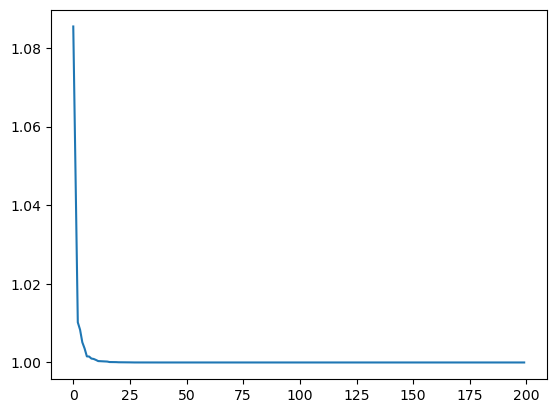

In [65]:
coeffs_avg = np.mean(coeffs, axis=0)
coeffs_avg.shape

sortind = np.argsort(np.abs(coeffs_avg))[::-1]

plt.plot(np.abs(coeffs_avg[sortind]))

In [66]:
sortind

array([  3,   0,  10,   5,  11,   1,   7,   8,   4,  13,  14,  23,   9,
        21,   2,  18,  12,  20,   6,  25,  16,  17,  15,  26,  27,  24,
        37,  30,  36,  28,  32,  39,  31,  34,  22,  35,  19,  43,  41,
        42,  33,  44,  40,  29,  48,  57,  49,  47,  46,  53,  55,  59,
        64,  54,  77,  52,  38,  51,  72,  74,  45,  63,  50,  89,  76,
        71,  90, 104,  85,  73,  60,  87,  58,  65,  69,  70, 119,  79,
        56,  68, 100,  83, 102,  66,  75,  84,  98,  78,  82, 134, 103,
       101, 135,  67, 116,  88, 152,  61,  81, 114,  99, 118, 115, 113,
        95, 133,  96, 117, 169, 131,  80,  97, 151, 150,  93, 111, 148,
       188, 128, 129, 189, 126, 112, 130, 168, 110, 146, 149, 108, 167,
        62, 165, 187, 166, 107, 163,  92, 143, 185, 170, 124, 145, 105,
       147, 106, 132, 125,  86, 144,  91, 182, 161, 141, 184, 186, 183,
       109, 123, 162, 180, 122, 164, 139, 160, 158, 190,  94, 140, 127,
       121, 154, 159, 120, 178, 142, 175, 194, 191, 138, 196, 19

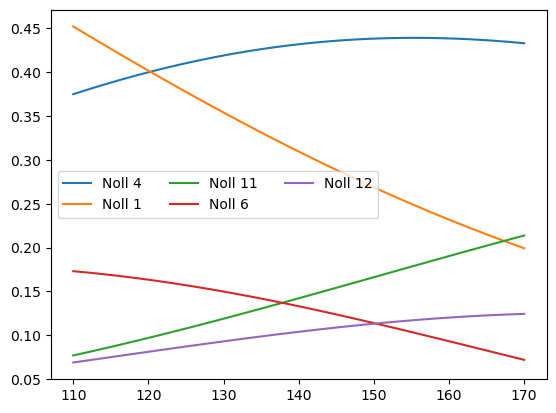

In [68]:
freqs = np.arange(110, 171)

for i in range(5):
    plt.plot(freqs, np.abs(coeffs[:,sortind[i]].real), label='Noll %i'%(sortind[i]+1))

plt.legend(ncol=3)


Text(0, 0.5, 'Imaginary coefficient energy')

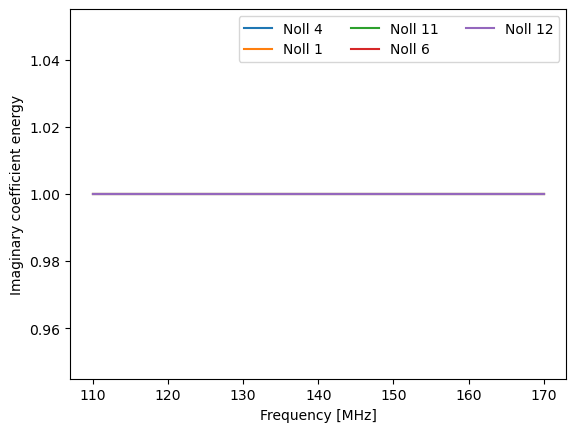

In [69]:
freqs = np.arange(110, 171)

for i in range(5):
    plt.plot(freqs, np.abs(coeffs[:,sortind[i]].imag), label='Noll %i'%(sortind[i]+1))

plt.legend(ncol=3)
plt.xlabel('Frequency [MHz]'); plt.ylabel('Imaginary coefficient energy')

In [95]:
safe_mem = int(avail_mem * 0.7)  # 70% of free memory
dtype_size = 8  # for float64, 8 bytes per element

max_elements = safe_mem // dtype_size
print(f"Maximum safe elements: {max_elements:,}")

Maximum safe elements: 754,855,987


In [96]:
safe_mem = int(avail_mem * 0.7)  # 70% of free memory
dtype_size = 8  # for float64, 8 bytes per element

max_elements = safe_mem // dtype_size
print(f"Maximum safe elements: {max_elements:,}")

Maximum safe elements: 754,855,987


In [112]:
size = 61*340*340*2*2
print(size)

28206400


In [110]:
for idx, f in enumerate(freqs[1:], start=1):
    print(idx,f)

1 122
2 124
3 126
4 128
5 130
6 132
7 134
8 136
9 138
10 140
11 142
12 144
13 146
14 148
15 150
16 152
17 154
18 156
19 158
20 160
21 162
22 164
23 166
24 168
25 170
26 172
27 174
28 176
29 178
30 180
